<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Contents: Unsupervised Learning Project
1. [Part-A: Solution](#Part-A:-Solution)
2. [Part-B: Solution](#Part-B:-Solution)

# Part-A: Solution

- **DOMAIN:** Automobile
- **CONTEXT:** The data concerns city-cycle fuel consumption in miles per gallon to be predicted in terms of 3 multivalued discrete and 5 continuous attributes.
- **DATA DESCRIPTION:**
 1. cylinders: multi-valued discrete 
 2. displacement: continuous 
 3. horsepower: continuous 
 4. weight: continuous 
 5. mpg: continuous
 6. acceleration: continuous
 7. model year: multi-valued discrete
 8. origin: multi-valued discrete
 9. car name: string (unique for each instance)
- **PROJECT OBJECTIVE:** To understand K-means Clustering by applying on the Car Dataset to segment the cars into various categories.

In [1]:
# Import all the relevant libraries needed to complete the analysis, visualization, modeling and presentation
import pandas as pd
import numpy as np
import os

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline

from scipy import stats
from scipy.stats import zscore

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn import model_selection
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, RandomizedSearchCV

from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster.hierarchy import fcluster
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_samples, silhouette_score
from kmodes.kprototypes import KPrototypes

import warnings
warnings.filterwarnings("ignore")

## 1. Data Understanding & Exploration:

### 1A. Read ‘Car name.csv’ as a DataFrame and assign it to a variable.

In [2]:
# CSV File 1
dfa1=pd.read_csv('Car name.csv')

In [3]:
dfa1.info()
dfa1.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   car_name  398 non-null    object
dtypes: object(1)
memory usage: 3.2+ KB


,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


### 1B. Read ‘Car-Attributes.json as a DataFrame and assign it to a variable.

In [4]:
# JSON File 1
dfa2=pd.read_json('Car-Attributes.json')

In [5]:
dfa2.info()
dfa2.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    object 
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    int64  
dtypes: float64(3), int64(4), object(1)
memory usage: 25.0+ KB


,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


### 1C. Merge both the DataFrames together to form a single DataFrame

In [6]:
dfa=pd.concat([dfa2,dfa1],axis=1)

In [7]:
dfa.info()
dfa.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [8]:
# Save this dataframe to csv, xlsx and json for general observation
# dfa.to_csv('mpg.csv', index=False)
# dfa.to_excel('mpg.xlsx', index = False)
# dfa.to_json('mpg.json', orient = 'split', compression = 'infer', index = 'true')

### 1D. Print 5 point summary of the numerical features and share insights.

In [9]:
# Describe function generates descriptive statistics that summarize the central tendency, 
# dispersion and shape of a dataset’s distribution, excluding NaN values.

# This method tells us a lot of things about a dataset. One important thing is that 
# the describe() method deals only with numeric values. It doesn't work with any 
# categorical values. So if there are any categorical values in a column the describe() 
# method will ignore it and display summary for the other columns.
dfa.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


**Observations:**

- mpg:
 - Mean and Median are nearly equal. Distribution might be normal.
 - 75 % of values are less than 29, and maximum value is 46.
- cyl:
 - Mean and median are not equal. Skewness is expected.
 - Range of values is small. It may be a categorical feature.
- disp:
 - Mean and Median are not equal. There is big  standard deviation. 
 - Distribution is not normal because of big SD.
- wt:
 - Mean and Median are not equal. Some skewness is present.
 - 75% of values are less than 3600, and maximum value is 5140.
- acc:
 - Mean and Median are nearly equal. Distribution might be normal.
 - Not much deviation in the data.
- yr:
 - Mean and Median are nearly equal. Distribution might be normal.
 - Range of values is small. It may be a categorical feature.
- origin
 - Mean and Median are not equal. Some skewness is present.
 - Not much deviation in the data. Range of values is small.

## 2. Data Preparation & Analysis:

### 2A. Check and print feature-wise percentage of missing values present in the data and impute with the best suitable approach.

In [10]:
# Percentage of missing values

# df.isnull().sum()
# df.isna().sum()

def missing_check(df):
    total = df.isnull().sum().sort_values(ascending=False)   # total number of null values
    percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)  # percentage of values that are null
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])  # putting the above two together
    return missing_data # return the dataframe
missing_check(dfa)

,Total,Percent
mpg,0,0.0
cyl,0,0.0
disp,0,0.0
hp,0,0.0
wt,0,0.0
acc,0,0.0
yr,0,0.0
origin,0,0.0
car_name,0,0.0


**2H. Check for unexpected values in all the features and datapoints with such values.**

In [11]:
# NaN shows no missing values, but on careful data observation we can see "?" for hp values
dfa[dfa['hp']=="?"]

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,?,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,?,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,?,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,?,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,?,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,?,3035,20.5,82,1,amc concord dl


In [12]:
# Replace missing values with NaN
dfa = dfa.replace('?', np.nan)

dfa.isna().sum()

mpg         0
cyl         0
disp        0
hp          6
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

In [13]:
# Understand the median values of all the variables
dfa.median()

mpg         23.0
cyl          4.0
disp       148.5
hp          93.5
wt        2803.5
acc         15.5
yr          76.0
origin       1.0
dtype: float64

In [14]:
# Replace hp with median value
dfa['hp'].fillna((dfa['hp'].median()), inplace=True)

In [15]:
print('Now the data set has no missing values:')
dfa.isnull().sum()

Now the data set has no missing values:


mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

### 2B. Check for duplicate values in the data and impute with the best suitable approach.

In [16]:
# To take a look at the duplication in the DataFrame as a whole, just call the duplicated() method on 
# the DataFrame. It outputs True if an entire row is identical to a previous row.
dfa.duplicated().sum()

0

In [17]:
# Count the number of non-duplicates
(~dfa.duplicated()).sum()

398

### 2C. Plot a pairplot for all features.

In [18]:
# Change the Datatype of quantitative features
col_cat=['hp']
    
#Function to convert the categorical to quantitative
def convert_to_cont(feature):
    dfa[feature]=pd.to_numeric(dfa[feature], errors='coerce')
    
for c in col_cat:
    convert_to_cont(c)

In [19]:
dfa.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    float64
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(4), int64(4), object(1)
memory usage: 28.1+ KB


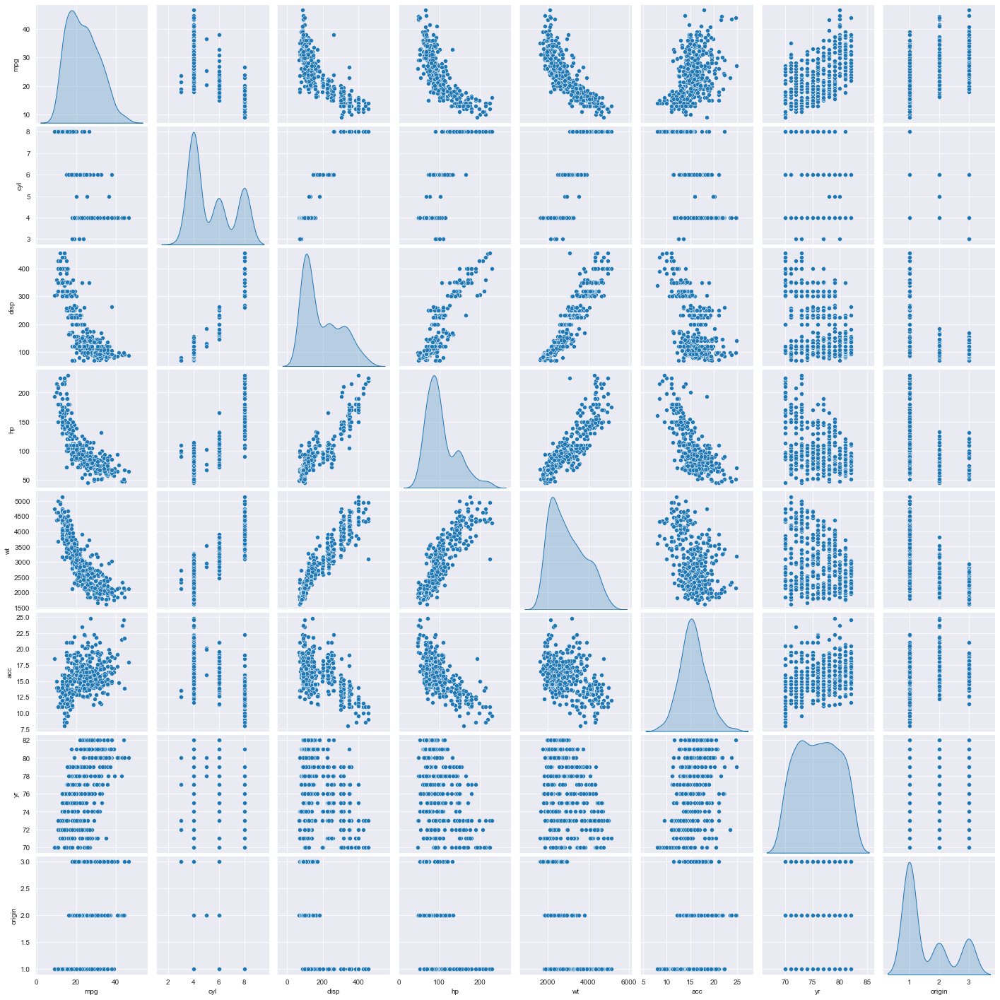

In [20]:
# Pair plot for the numeric attributes
sns.pairplot(dfa, diag_kind='kde');

**Observations:**

- From diagonal plots, we can see origin, cyl and disp has 3 peaks.
- hp, wt and yr showing 2 peaks.
- Other peaks are not so prominent.
- acc, mpg have a near normal distribution.
- mpg shows negative relationship with wt, hp and disp.
- disp has positive relationship with hp, wt, and negative relationship with mpg.
- acc has negative relationship with wt, hp and disp.
- More corresponding relationships can be inferred from the above graph if required.

### 2D. Visualize a scatterplot for ‘wt’ and ‘disp’. Datapoints should be distinguishable by ‘cyl’.

<AxesSubplot:xlabel='wt', ylabel='disp'>

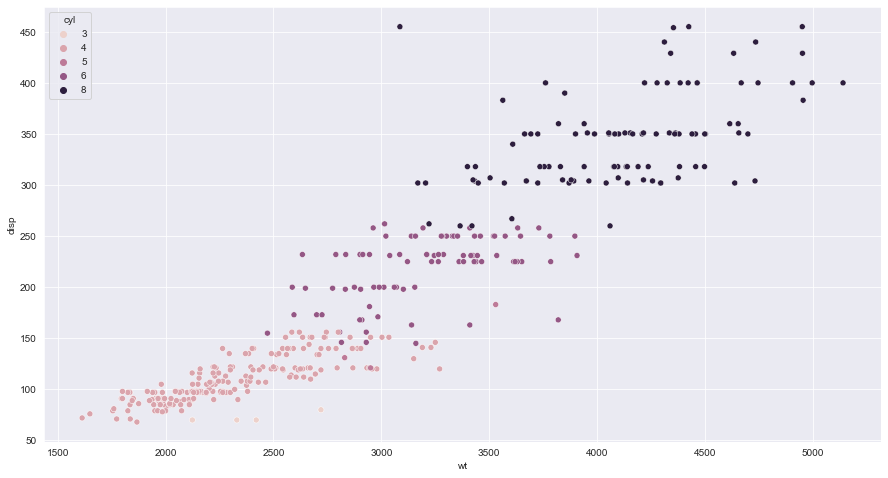

In [21]:
plt.figure(figsize=(15,8))
sns.scatterplot(data = dfa, x="wt", y="disp", hue="cyl")

### 2E. Share insights for Q2.d.

**Observations:**
- Positive correlation exists between wt and disp.
- The correlation between wt and disp decreases as the number of cylinders increase.
- Good clusters are visible for 4, 6, and 8 cylinders.
- Presence of outliers affect the value of regression coefficients.

### 2F. Visualize a scatterplot for ‘wt’ and ’mpg’. Datapoints should be distinguishable by ‘cyl’.

<AxesSubplot:xlabel='wt', ylabel='mpg'>

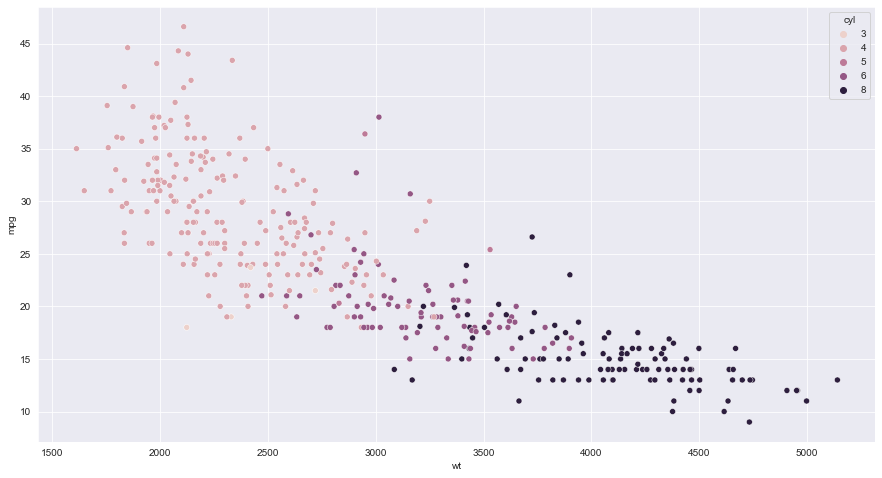

In [22]:
plt.figure(figsize=(15,8))
sns.scatterplot(data = dfa, x="wt", y="mpg", hue="cyl")

### 2G. Share insights for Q2.f.

**Observations:**
- Negative correlation exists between wt and mpg.
- The correlation between wt and mpg increases as the number of cylinders increase.
- Good clusters are visible for 4 and 8 cylinders.
- Presence of outliers affect the value of regression coefficients.

### 2H. Check for unexpected values in all the features and datapoints with such values.
[Hint: ‘?’ is present in ‘hp’]

In [23]:
# For sake of simplicity and better EDA, This part has been completed in 2A above.

### Quick EDA

#### Correlation Heatmap

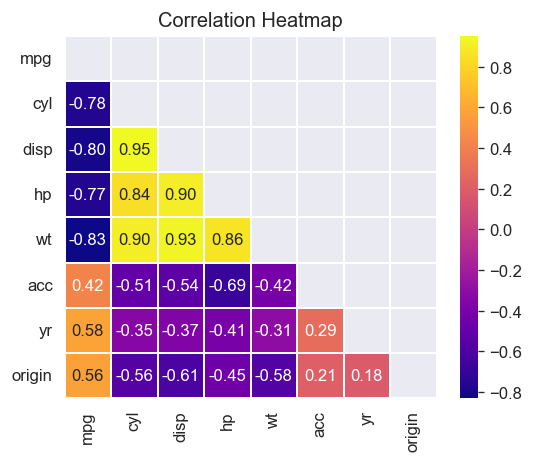

In [24]:
# Visualize a heatmap to understand correlation between all features
plt.figure(dpi = 120,figsize= (5,4))
mask = np.triu(np.ones_like(dfa.corr()))
sns.heatmap(dfa.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

In [25]:
corr = dfa.corr()
corr

,mpg,cyl,disp,hp,wt,acc,yr,origin
mpg,1.000000,-0.775396,-0.804203,-0.773453,-0.831741,0.420289,0.579267,0.563450
cyl,-0.775396,1.000000,0.950721,0.841284,0.896017,-0.505419,-0.348746,-0.562543
disp,-0.804203,0.950721,1.000000,0.895778,0.932824,-0.543684,-0.370164,-0.609409
hp,-0.773453,0.841284,0.895778,1.000000,0.862442,-0.686590,-0.413733,-0.452096
wt,-0.831741,0.896017,0.932824,0.862442,1.000000,-0.417457,-0.306564,-0.581024
acc,0.420289,-0.505419,-0.543684,-0.686590,-0.417457,1.000000,0.288137,0.205873
yr,0.579267,-0.348746,-0.370164,-0.413733,-0.306564,0.288137,1.000000,0.180662
origin,0.563450,-0.562543,-0.609409,-0.452096,-0.581024,0.205873,0.180662,1.000000


In [26]:
dfa.var()

mpg           61.089611
cyl            2.893415
disp       10872.199152
hp          1460.969052
wt        717140.990526
acc            7.604848
yr            13.672443
origin         0.643292
dtype: float64

#### Distribution and Outliers

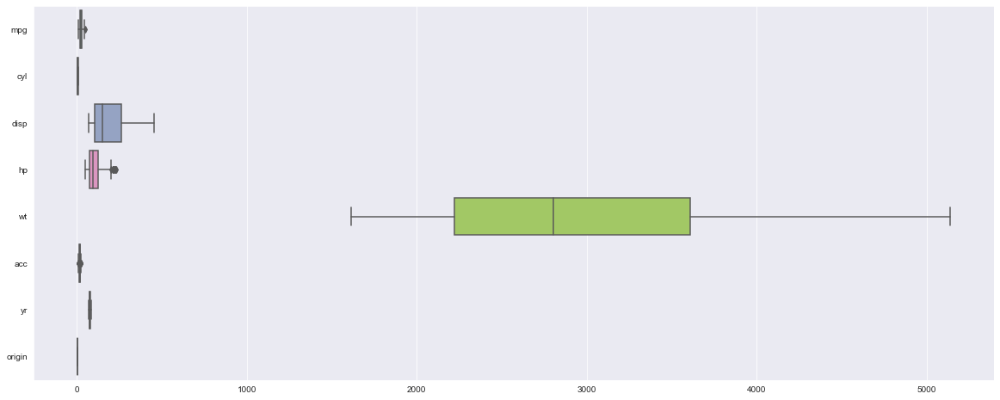

In [27]:
# Single Box Plot
plt.figure(figsize=(20,8))
ax = sns.boxplot(data=dfa, orient="h", palette="Set2")

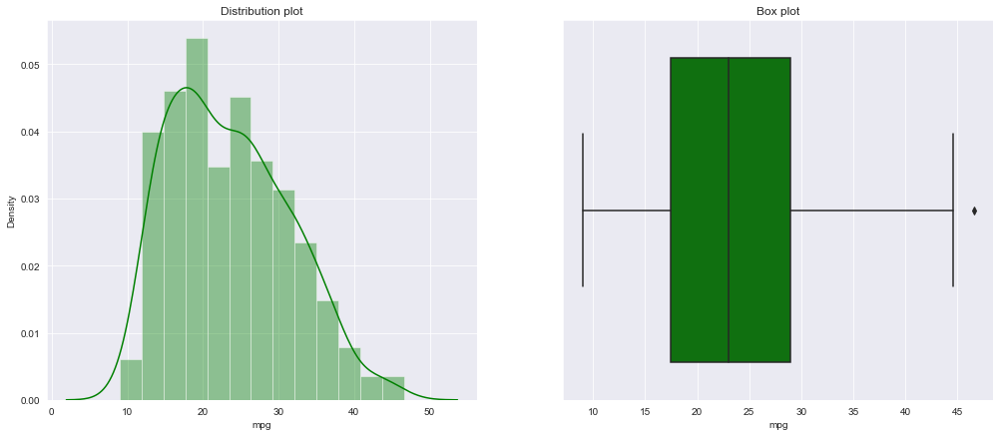

 Total Number of outliers in mpg: 1


In [28]:
# mpg

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['mpg'],  ax=axes[0],color='Green')
sns.boxplot(x = 'mpg', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['mpg'],25),np.percentile(dfa['mpg'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['mpg'] if i < lower or i > upper]
print('{} Total Number of outliers in mpg: {}'.format('\033[1m',len(Outliers)))

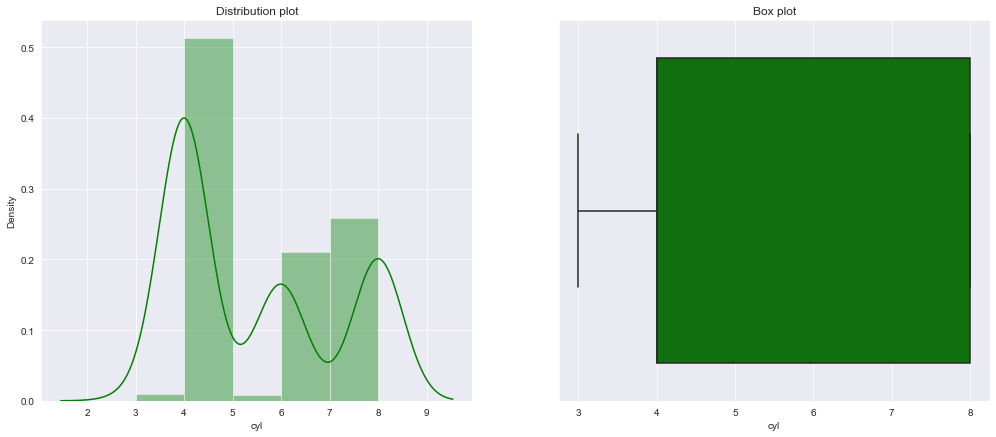

 Total Number of outliers in cyl: 0


In [29]:
# cyl

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['cyl'],  ax=axes[0],color='Green')
sns.boxplot(x = 'cyl', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['cyl'],25),np.percentile(dfa['cyl'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['cyl'] if i < lower or i > upper]
print('{} Total Number of outliers in cyl: {}'.format('\033[1m',len(Outliers)))

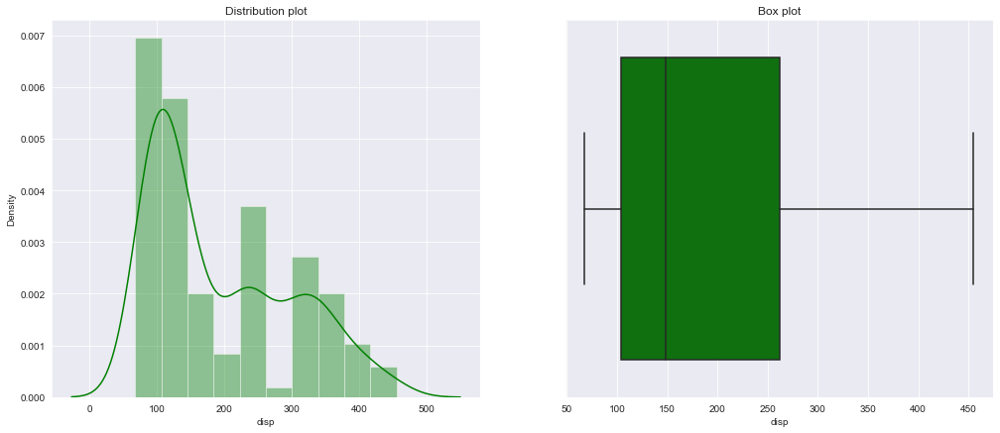

 Total Number of outliers in disp: 0


In [30]:
# disp

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['disp'],  ax=axes[0],color='Green')
sns.boxplot(x = 'disp', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['disp'],25),np.percentile(dfa['disp'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['disp'] if i < lower or i > upper]
print('{} Total Number of outliers in disp: {}'.format('\033[1m',len(Outliers)))

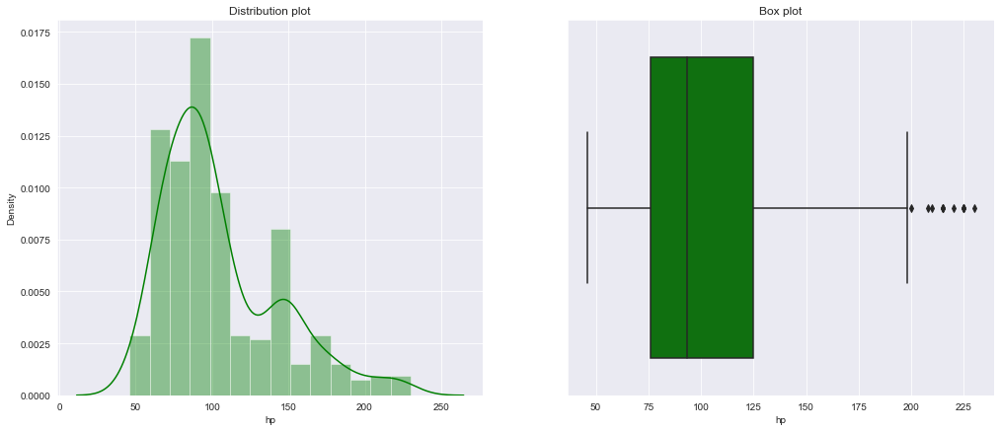

 Total Number of outliers in hp: 11


In [31]:
# hp

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['hp'],  ax=axes[0],color='Green')
sns.boxplot(x = 'hp', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['hp'],25),np.percentile(dfa['hp'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['hp'] if i < lower or i > upper]
print('{} Total Number of outliers in hp: {}'.format('\033[1m',len(Outliers)))

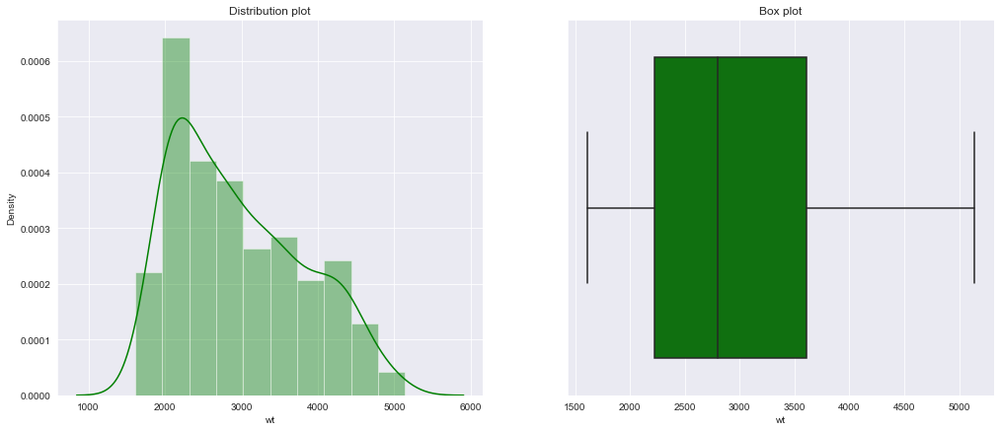

 Total Number of outliers in wt: 0


In [32]:
# wt

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['wt'],  ax=axes[0],color='Green')
sns.boxplot(x = 'wt', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['wt'],25),np.percentile(dfa['wt'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['wt'] if i < lower or i > upper]
print('{} Total Number of outliers in wt: {}'.format('\033[1m',len(Outliers)))

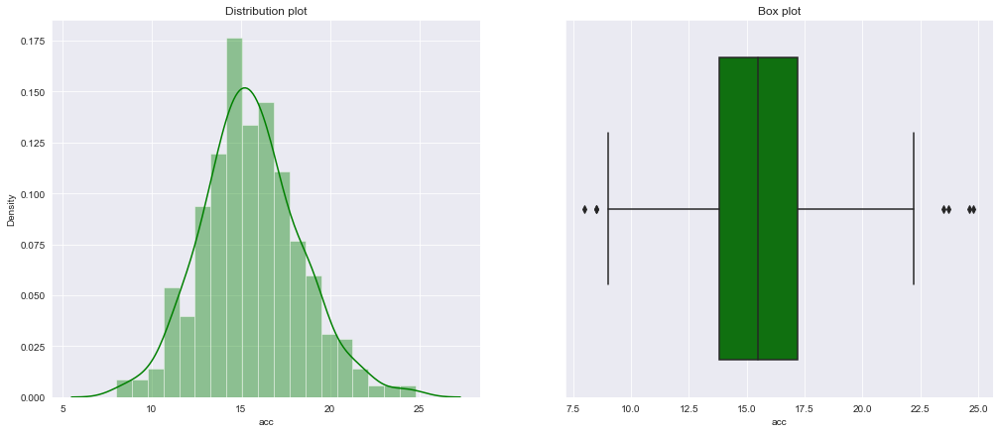

 Total Number of outliers in acc: 7


In [33]:
# acc

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['acc'],  ax=axes[0],color='Green')
sns.boxplot(x = 'acc', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['acc'],25),np.percentile(dfa['acc'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['acc'] if i < lower or i > upper]
print('{} Total Number of outliers in acc: {}'.format('\033[1m',len(Outliers)))

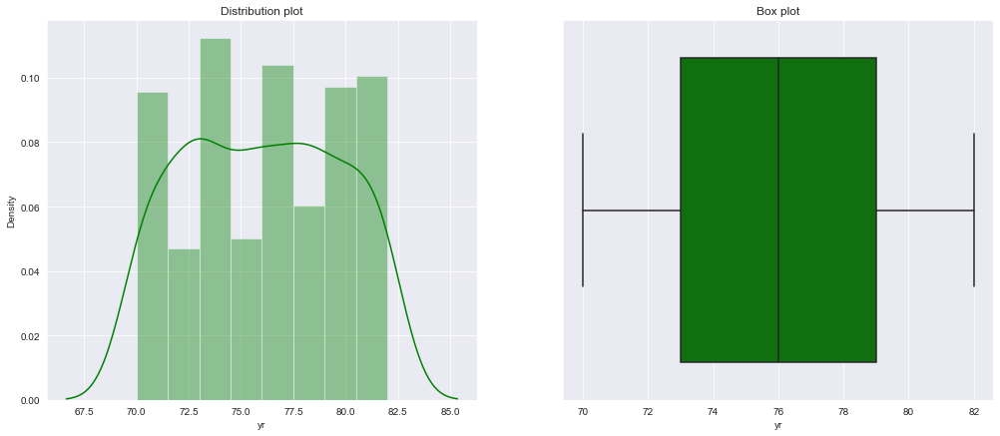

 Total Number of outliers in yr: 0


In [34]:
# yr

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['yr'],  ax=axes[0],color='Green')
sns.boxplot(x = 'yr', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['yr'],25),np.percentile(dfa['yr'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['yr'] if i < lower or i > upper]
print('{} Total Number of outliers in yr: {}'.format('\033[1m',len(Outliers)))

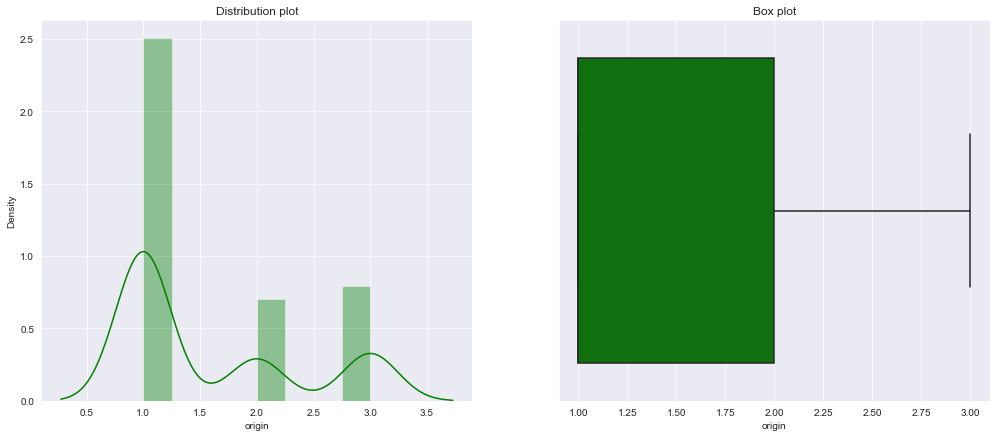

 Total Number of outliers in origin: 0


In [35]:
# origin

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfa['origin'],  ax=axes[0],color='Green')
sns.boxplot(x = 'origin', data=dfa,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfa['origin'],25),np.percentile(dfa['origin'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfa['origin'] if i < lower or i > upper]
print('{} Total Number of outliers in origin: {}'.format('\033[1m',len(Outliers)))

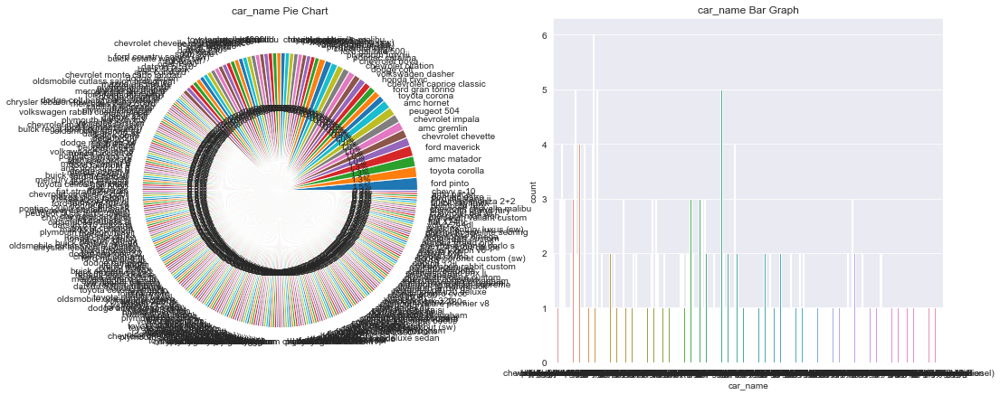

In [36]:
# car_name

f,axes=plt.subplots(1,2,figsize=(17,7))
dfa['car_name'].value_counts().plot.pie(autopct='%1.1f%%',ax=axes[0])
sns.countplot('car_name',data=dfa,ax=axes[1])
axes[0].set_title('car_name Pie Chart')
axes[1].set_title('car_name Bar Graph')
plt.show()

#### Remove Outliers

In [37]:
# Impute outliers with mean

col=['mpg','hp','acc']
for c in col:
    # Use the IQR method
    q25,q75=np.percentile(dfa[c],25),np.percentile(dfa[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in dfa[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',c,len(Outliers)))
    # Mean of the column without considering the outliers
    dfa_include = dfa.loc[(dfa[c] >= lower) & (dfa[c] <= upper)]
    mean=int(dfa_include[c].mean())
    print('{} Mean of {} is {}'.format('\033[1m',c,mean))
    # Impute outliers with mean
    dfa[c]=np.where(dfa[c]>upper,mean,dfa[c])
    dfa[c]=np.where(dfa[c]<lower,mean,dfa[c])
    Outliers=[i for i in dfa[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',c,len(Outliers)))  
    print('\n')

 Total Number of outliers in mpg Before Imputing : 1
 Mean of mpg is 23
 Total Number of outliers in mpg After Imputing : 0


 Total Number of outliers in hp Before Imputing : 11
 Mean of hp is 101
 Total Number of outliers in hp After Imputing : 0


 Total Number of outliers in acc Before Imputing : 7
 Mean of acc is 15
 Total Number of outliers in acc After Imputing : 0




In [38]:
dfa.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford torino


#### Normalize/Standardize the data with the best suitable approach.

In [39]:
dfa1=dfa.drop(['car_name'],axis=1)

In [40]:
# Using different scaling methods:
# scaler = RobustScaler()
# scaler = MinMaxScaler()
scaler = StandardScaler()
# mydata = mydata.apply(zscore)

cols_to_scale = ["mpg","cyl","disp","hp","wt","acc","yr","origin"]

dfa1[cols_to_scale] = scaler.fit_transform(dfa1[cols_to_scale])

In [41]:
dfa1.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,-1.627426,-0.715145
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,-1.627426,-0.715145
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,-1.627426,-0.715145
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,-1.627426,-0.715145
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,-1.627426,-0.715145


## 3. Clustering with all Features:

### 3A. Apply K-Means clustering for 2 to 10 clusters.

In [42]:
# Train KMeans for 2 to 10 clusters

cluster_range = range(2,11)
inertia = []
silh_score = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 10, random_state=0)
    clusters.fit(dfa1)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    inertia.append(clusters.inertia_)
    silh_score.append(silhouette_score(dfa1, labels))
    
# Dataframe for num_clusters, cluster_errors and silh_score
clusters_dfa1 = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": inertia, "silh_score": silh_score})
clusters_dfa1

,num_clusters,cluster_errors,silh_score
0,2,1595.231626,0.412242
1,3,1207.004572,0.322470
2,4,1009.446630,0.307676
3,5,852.625493,0.327032
4,6,773.180222,0.326188
5,7,716.578124,0.282945
6,8,674.321489,0.264558
7,9,636.079624,0.252967
8,10,595.800185,0.250441


### 3B. Plot a visual and find elbow point.

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

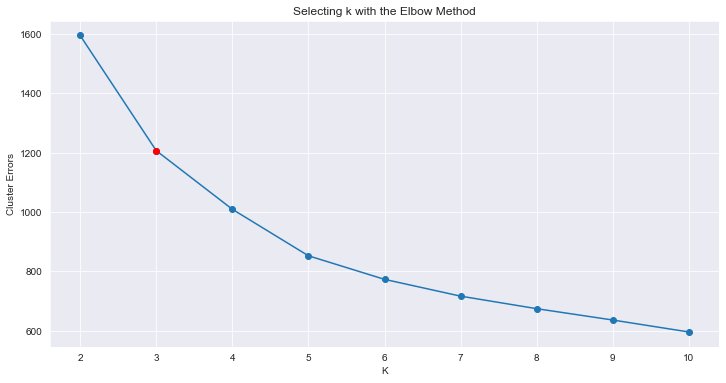

In [43]:
# Select K based on Inertia or Cluster Errors
plt.figure(figsize=(12,6))
plt.plot( clusters_dfa1.num_clusters, clusters_dfa1.cluster_errors, marker = "o" )

plt.xlabel('K')
plt.ylabel('Cluster Errors')
plt.plot(clusters_dfa1.num_clusters[1], clusters_dfa1.cluster_errors[1], 'ro')
plt.title('Selecting k with the Elbow Method')

Let's plot the silhouette score as a function of K :

Text(0.5, 1.0, 'Selecting k with Silhouette Score')

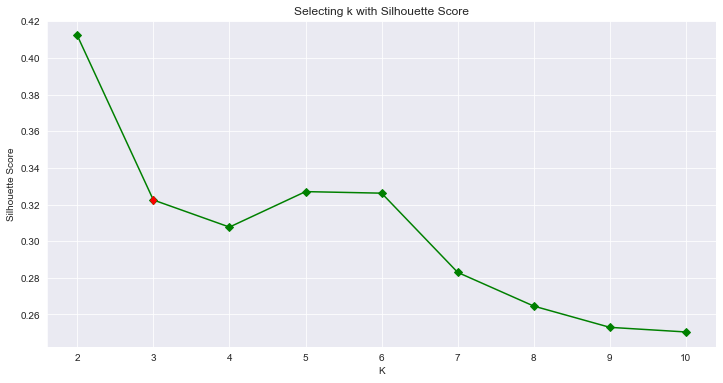

In [44]:
# Select K based on Silhouette Score
plt.figure(figsize=(12,6))
plt.plot(clusters_dfa1.num_clusters, clusters_dfa1.silh_score, marker = "D", color = 'g')

plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.plot(clusters_dfa1.num_clusters[1], clusters_dfa1.silh_score[1], 'rd')
plt.title('Selecting k with Silhouette Score')

### 3C. On the above visual, highlight which are the possible Elbow points.

In [45]:
# Consider the k=2 and k=3

# As you can see, there is an elbow at  𝑘=3 , which means that less clusters than that would be bad, 
# and more clusters would not help much and might cut clusters in half. So  𝑘=3  is a pretty good choice.

Another approach is to look at the silhouette score, which is the mean silhouette coefficient over all the instances. An instance's silhouette coefficient is equal to  (𝑏−𝑎)/max(𝑎,𝑏)  where  𝑎  is the mean distance to the other instances in the same cluster (it is the mean intra-cluster distance), and  𝑏  is the mean nearest-cluster distance, that is the mean distance to the instances of the next closest cluster (defined as the one that minimizes  𝑏 , excluding the instance's own cluster). The silhouette coefficient can vary between -1 and +1: a coefficient close to +1 means that the instance is well inside its own cluster and far from other clusters, while a coefficient close to 0 means that it is close to a cluster boundary, and finally a coefficient close to -1 means that the instance may have been assigned to the wrong cluster.

In [46]:
# Consider the k=2 and k=3

# As you can see, this visualization is much richer than the previous one: in particular, 
# although it confirms that  𝑘=2  is a very good choice, but it also underlines the fact 
# that  𝑘=3  is quite good as well.

### 3D. Train a K-means clustering model once again on the optimal number of clusters.

In [47]:
# Train and fit K-means algorithm on the relevant K
kmeans = KMeans(n_clusters=3, n_init = 10, random_state=0)
kmeans.fit(dfa1)

KMeans(n_clusters=3, random_state=0)

In [48]:
# Check the number of datapoints in each cluster
labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[163 100 135]


In [49]:
# let us check the cluster centers in each group
centroids = kmeans.cluster_centers_
centroid_dfa1 = pd.DataFrame(centroids, columns = list(dfa1) )
centroid_dfa1.transpose()

,0,1,2
mpg,0.888640,-1.132200,-0.234284
cyl,-0.816597,1.486419,-0.115085
disp,-0.863549,1.468657,-0.045238
hp,-0.713009,1.411633,-0.184761
wt,-0.865217,1.367364,0.031807
acc,0.213278,-1.025758,0.502308
yr,0.297965,-0.611986,0.093557
origin,0.946791,-0.715145,-0.613426


### 3E. Add a new feature in the DataFrame which will have labels based upon cluster value.

In [50]:
# Add cluster numbers to original cars data
predictions = kmeans.predict(dfa1)

dfa["group"] = predictions
dfa['group'] = dfa['group'].astype('category')
dfa.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name,group
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu,1
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320,1
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite,1
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc rebel sst,1
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford torino,1


In [51]:
# Save this dataframe to csv, xlsx for general observation
# dfa.to_csv('mpg1.csv', index=False)
# dfa.to_excel('mpg1.xlsx', index = False)

In [52]:
# Add cluster numbers to scaled cars data
predictions = kmeans.predict(dfa1)

dfa1["group"] = predictions
dfa1['group'] = dfa['group'].astype('category')
dfa1.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,group
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,-1.627426,-0.715145,1
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,-1.627426,-0.715145,1
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,-1.627426,-0.715145,1
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,-1.627426,-0.715145,1
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,-1.627426,-0.715145,1


array([[<AxesSubplot:title={'center':'acc'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'disp'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[group]'>],
       [<AxesSubplot:title={'center':'mpg'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'origin'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'yr'}, xlabel='[group]'>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]],
      dtype=object)

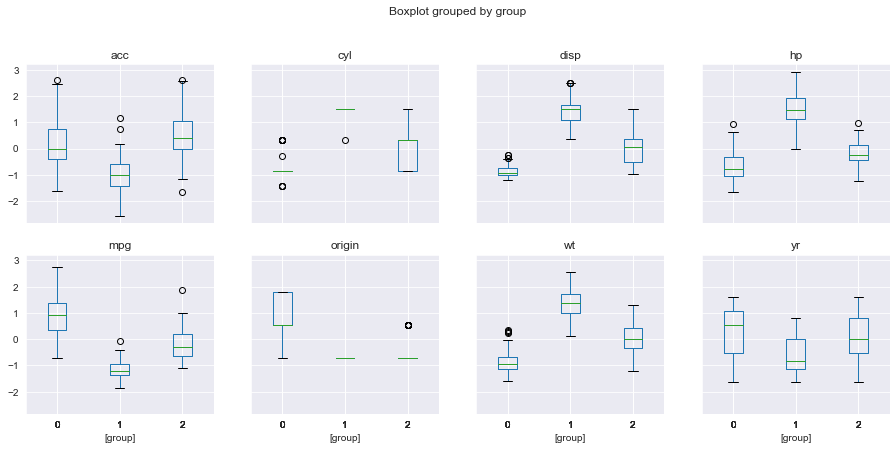

In [53]:
# Visualize the clusters with respect to various attributes
dfa1.boxplot(by = 'group', layout=(3,4), figsize=(15, 10))

### 3F. Plot a visual and color the datapoints based upon clusters.

<AxesSubplot:xlabel='mpg', ylabel='cyl'>

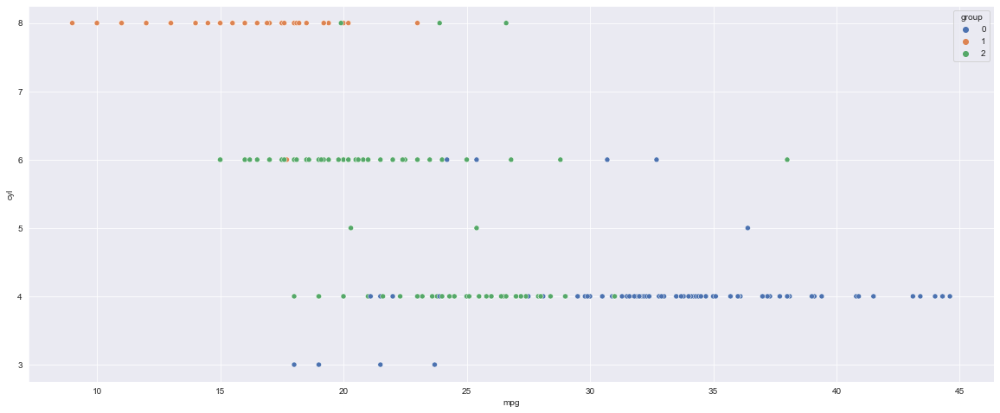

In [54]:
# In my opinion, the best approach is to use multiple scatter plots, either in a matrix format or 
# by changing between variables. You can also consider using some data reduction method such as 
# PCA to consolidate your variables into a smaller number of factors.
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="cyl", hue="group", palette="deep")

<AxesSubplot:xlabel='mpg', ylabel='origin'>

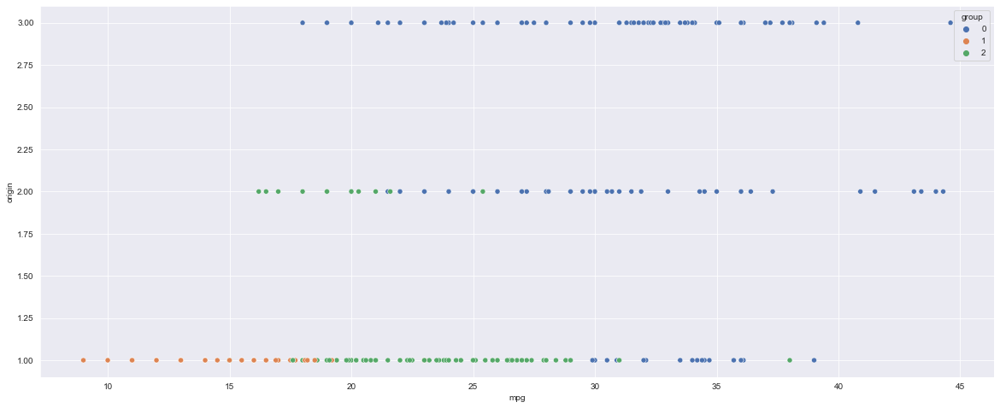

In [55]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="origin", hue="group", palette="deep")

<AxesSubplot:xlabel='mpg', ylabel='hp'>

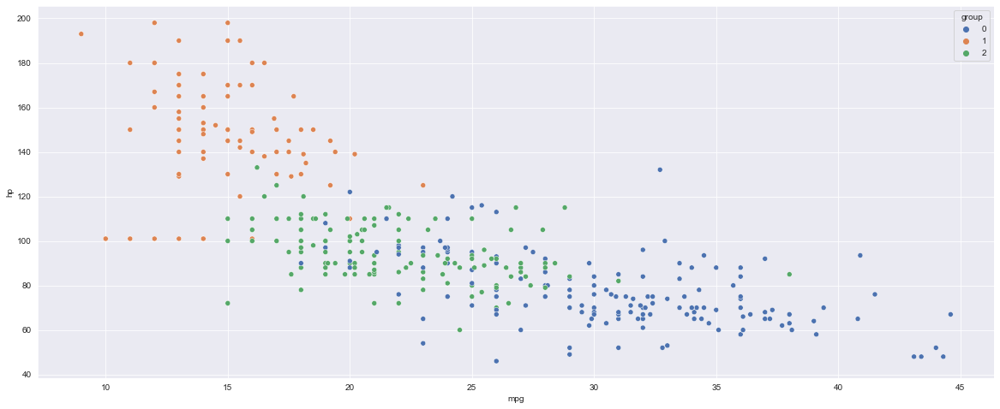

In [56]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="hp", hue="group", palette="deep")

<AxesSubplot:xlabel='mpg', ylabel='wt'>

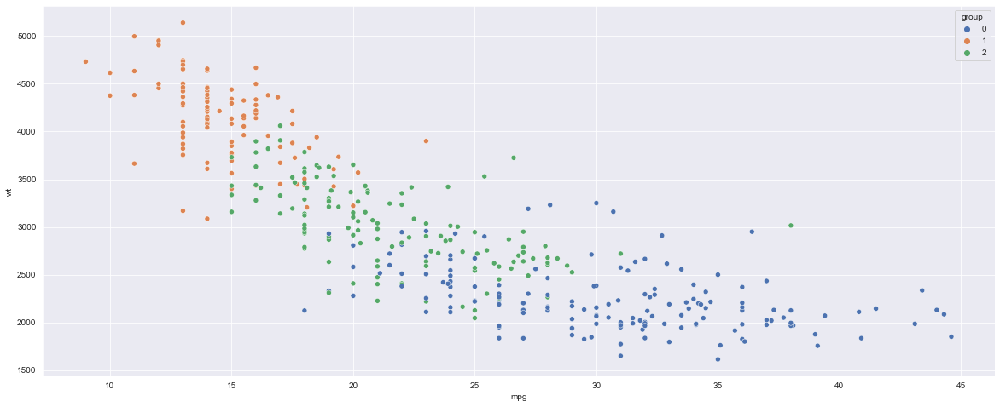

In [57]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="wt", hue="group", palette="deep")

<AxesSubplot:xlabel='wt', ylabel='hp'>

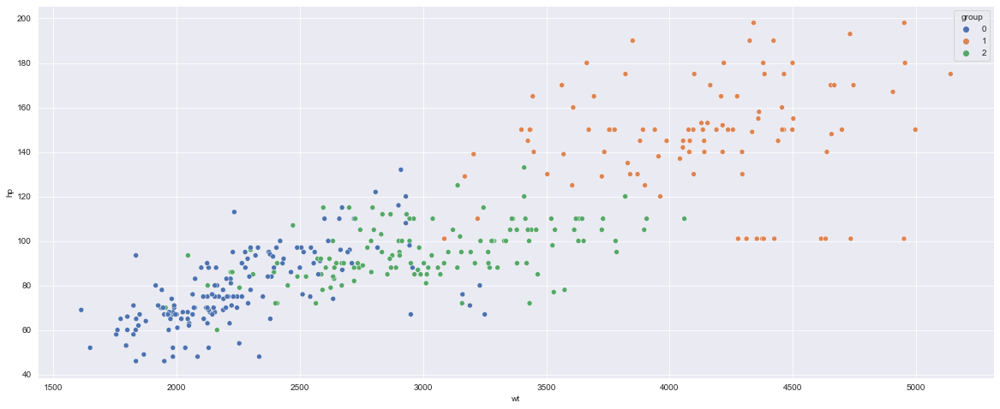

In [58]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="wt", y="hp", hue="group", palette="deep")

### 3G. Pass a new DataPoint and predict which cluster it belongs to.

In [59]:
# Initialize list elements
data = [10, 5, 100, 50, 2000, 21, 70, 1, 'toyota']
  
# Create the pandas DataFrame with column names provided explicitly
new_datapoint = pd.DataFrame([data], columns=['mpg','cyl','disp','hp','wt','acc','yr','origin','car_name'])
  
# Print dataframe.
new_datapoint

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,10,5,100,50,2000,21,70,1,toyota


In [60]:
new_datapoint1=new_datapoint.drop(['car_name'],axis=1)

In [61]:
new_datapoint1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   mpg     1 non-null      int64
 1   cyl     1 non-null      int64
 2   disp    1 non-null      int64
 3   hp      1 non-null      int64
 4   wt      1 non-null      int64
 5   acc     1 non-null      int64
 6   yr      1 non-null      int64
 7   origin  1 non-null      int64
dtypes: int64(8)
memory usage: 192.0 bytes


In [62]:
# Add cluster numbers to the new datapoint created above
predictions = kmeans.predict(new_datapoint1)

new_datapoint["group"] = predictions
new_datapoint['group'] = new_datapoint['group'].astype('category')
new_datapoint.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name,group
0,10,5,100,50,2000,21,70,1,toyota,1


**Improving the quality of clusters in next section...**

## 3. Clustering with reduced Features:

In [63]:
dfa=dfa.drop(['group'],axis=1)
dfa.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford torino


In [64]:
# Use dummy variables for cyl and origin. We can also drop them.

# dfa1 = pd.get_dummies(data=dfa1, columns=['origin', 'cyl'])
# dfa1=dfa1.drop(["origin", "yr"],axis=1)

dfa1=dfa.drop(["yr","origin","car_name"],axis=1)
dfa1.head()

# Removing features based on following articles:
# https://towardsdatascience.com/interpretable-k-means-clusters-feature-importances-7e516eeb8d3c
# https://towardsdatascience.com/the-k-prototype-as-clustering-algorithm-for-mixed-data-type-categorical-and-numerical-fe7c50538ebb

,mpg,cyl,disp,hp,wt,acc
0,18.0,8,307.0,130.0,3504,12.0
1,15.0,8,350.0,165.0,3693,11.5
2,18.0,8,318.0,150.0,3436,11.0
3,16.0,8,304.0,150.0,3433,12.0
4,17.0,8,302.0,140.0,3449,10.5


In [65]:
# Using different scaling methods:
# scaler = RobustScaler()
# scaler = MinMaxScaler()
scaler = StandardScaler()
# mydata = mydata.apply(zscore)

cols_to_scale = ["mpg","cyl","disp","hp","wt","acc"]

dfa1[cols_to_scale] = scaler.fit_transform(dfa1[cols_to_scale])

In [66]:
dfa1.head()

,mpg,cyl,disp,hp,wt,acc
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923


### 3A. Apply K-Means clustering for 2 to 10 clusters.

In [67]:
# Train KMeans for 2 to 10 clusters

cluster_range = range(2,11)
inertia = []
silh_score = []
for num_clusters in cluster_range:
    clusters = KMeans(num_clusters, n_init = 10, random_state=0)
    clusters.fit(dfa1)
    labels = clusters.labels_
    centroids = clusters.cluster_centers_
    inertia.append(clusters.inertia_)
    silh_score.append(silhouette_score(dfa1, labels))
    
# Dataframe for num_clusters and cluster_errors
clusters_dfa1 = pd.DataFrame({"num_clusters": cluster_range, "cluster_errors": inertia, "silh_score": silh_score})
clusters_dfa1

,num_clusters,cluster_errors,silh_score
0,2,966.977672,0.535571
1,3,628.265582,0.432740
2,4,513.779062,0.368362
3,5,440.432738,0.364848
4,6,402.573608,0.328106
5,7,365.469301,0.281410
6,8,334.901294,0.273411
7,9,317.105375,0.271613
8,10,287.888145,0.288018


**With reduced set of features, we have lower cluster errors and higher Silhouette Scores.**

### 3B. Plot a visual and find elbow point.

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

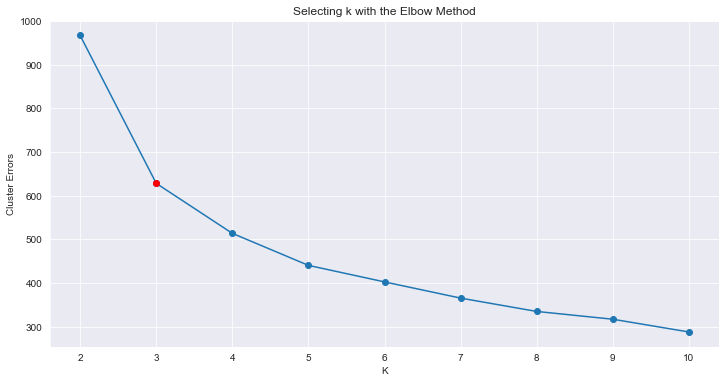

In [68]:
# Select K based on Inertia or Cluster Errors
plt.figure(figsize=(12,6))
plt.plot( clusters_dfa1.num_clusters, clusters_dfa1.cluster_errors, marker = "o" )

plt.xlabel('K')
plt.ylabel('Cluster Errors')
plt.plot(clusters_dfa1.num_clusters[1], clusters_dfa1.cluster_errors[1], 'ro')
plt.title('Selecting k with the Elbow Method')

Let's plot the silhouette score as a function of K :

Text(0.5, 1.0, 'Selecting k with Silhouette Score')

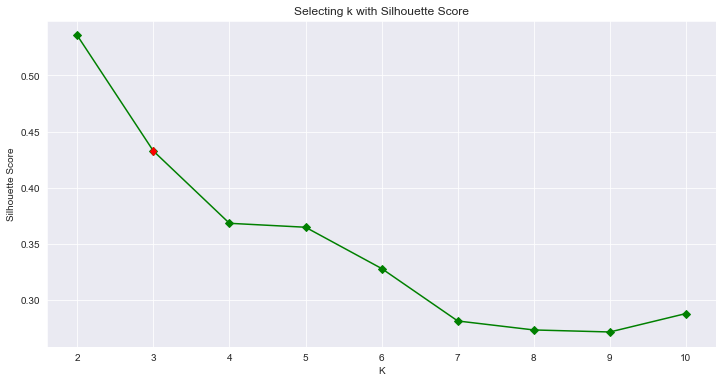

In [69]:
# Select K based on Silhouette Score
plt.figure(figsize=(12,6))
plt.plot(clusters_dfa1.num_clusters, clusters_dfa1.silh_score, marker = "D", color = 'g')

plt.xlabel('K')
plt.ylabel('Silhouette Score')
plt.plot(clusters_dfa1.num_clusters[1], clusters_dfa1.silh_score[1], 'rd')
plt.title('Selecting k with Silhouette Score')

### 3C. On the above visual, highlight which are the possible Elbow points.

In [70]:
# Consider the k=2 and k=3

# As you can see, there is an elbow at  𝑘=3, which means that less clusters than that would be bad, 
# and more clusters would not help much and might cut clusters in half. So  𝑘=3  is a pretty good choice.

Another approach is to look at the silhouette score, which is the mean silhouette coefficient over all the instances. An instance's silhouette coefficient is equal to  (𝑏−𝑎)/max(𝑎,𝑏)  where  𝑎  is the mean distance to the other instances in the same cluster (it is the mean intra-cluster distance), and  𝑏  is the mean nearest-cluster distance, that is the mean distance to the instances of the next closest cluster (defined as the one that minimizes  𝑏 , excluding the instance's own cluster). The silhouette coefficient can vary between -1 and +1: a coefficient close to +1 means that the instance is well inside its own cluster and far from other clusters, while a coefficient close to 0 means that it is close to a cluster boundary, and finally a coefficient close to -1 means that the instance may have been assigned to the wrong cluster.

In [71]:
# Consider the k=2 and k=3

# As you can see, this visualization is much richer than the previous one: in particular, 
# although it confirms that  𝑘=2  is a very good choice, but it also underlines the fact 
# that  𝑘=3  is quite good as well.

### 3D. Train a K-means clustering model once again on the optimal number of clusters.

In [72]:
# Train and fit K-means algorithm on the relevant K
kmeans = KMeans(n_clusters=3, n_init = 10, random_state=0)
kmeans.fit(dfa1)

KMeans(n_clusters=3, random_state=0)

In [73]:
# Check the number of datapoints in each cluster
labels = kmeans.labels_
counts = np.bincount(labels[labels>=0])
print(counts)

[ 98 207  93]


In [74]:
# let us check the cluster centers in each group
centroids = kmeans.cluster_centers_
centroid_dfa1 = pd.DataFrame(centroids, columns = list(dfa1) )
centroid_dfa1.transpose()

,0,1,2
mpg,-1.150137,0.755300,-0.469180
cyl,1.486178,-0.853477,0.333594
disp,1.476568,-0.803214,0.231845
hp,1.430318,-0.682213,0.011256
wt,1.381031,-0.785499,0.293088
acc,-1.046078,0.338624,0.348606


### 3E. Add a new feature in the DataFrame which will have labels based upon cluster value.

In [75]:
# Add cluster numbers to original cars data
predictions = kmeans.predict(dfa1)

dfa["group"] = predictions
dfa['group'] = dfa['group'].astype('category')
dfa.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name,group
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet chevelle malibu,0
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick skylark 320,0
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth satellite,0
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc rebel sst,0
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford torino,0


In [76]:
#Save this dataframe to csv, xlsx for general observation
# dfa.to_csv('mpg1.csv', index=False)
# dfa.to_excel('mpg1.xlsx', index = False)

In [77]:
# Add cluster numbers to scaled cars data
predictions = kmeans.predict(dfa1)

dfa1["group"] = predictions
dfa1['group'] = dfa['group'].astype('category')
dfa1.head()

,mpg,cyl,disp,hp,wt,acc,group
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,0
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,0
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,0
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,0
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,0


array([[<AxesSubplot:title={'center':'acc'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'cyl'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'disp'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'hp'}, xlabel='[group]'>],
       [<AxesSubplot:title={'center':'mpg'}, xlabel='[group]'>,
        <AxesSubplot:title={'center':'wt'}, xlabel='[group]'>,
        <AxesSubplot:>, <AxesSubplot:>],
       [<AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>, <AxesSubplot:>]],
      dtype=object)

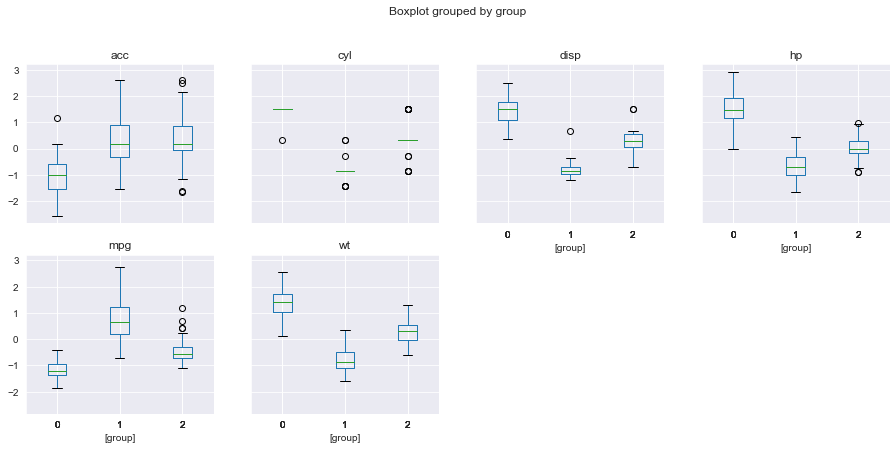

In [78]:
# Visualize the clusters with respect to various attributes
dfa1.boxplot(by = 'group', layout=(3,4), figsize=(15, 10))

### 3F. Plot a visual and color the datapoints based upon clusters.

<AxesSubplot:xlabel='mpg', ylabel='cyl'>

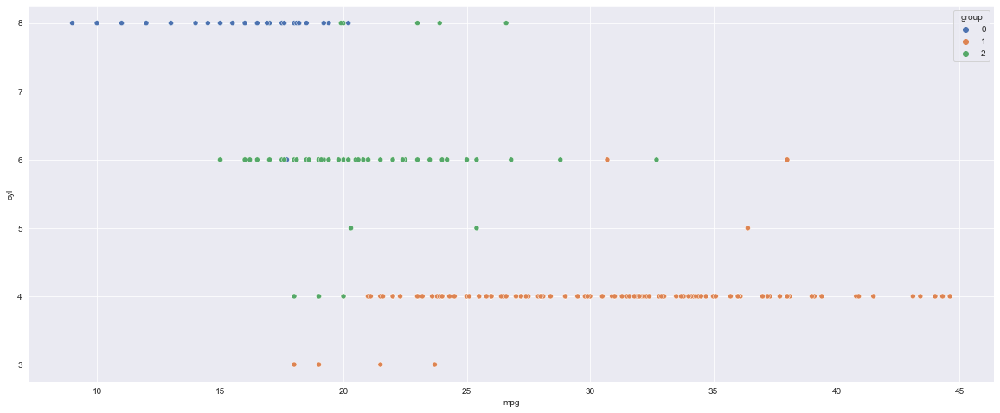

In [79]:
# In my opinion, the best approach is to use multiple scatter plots, either in a matrix format or 
# by changing between variables. You can also consider using some data reduction method such as 
# PCA to consolidate your variables into a smaller number of factors.
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="cyl", hue="group", palette="deep")

<AxesSubplot:xlabel='mpg', ylabel='origin'>

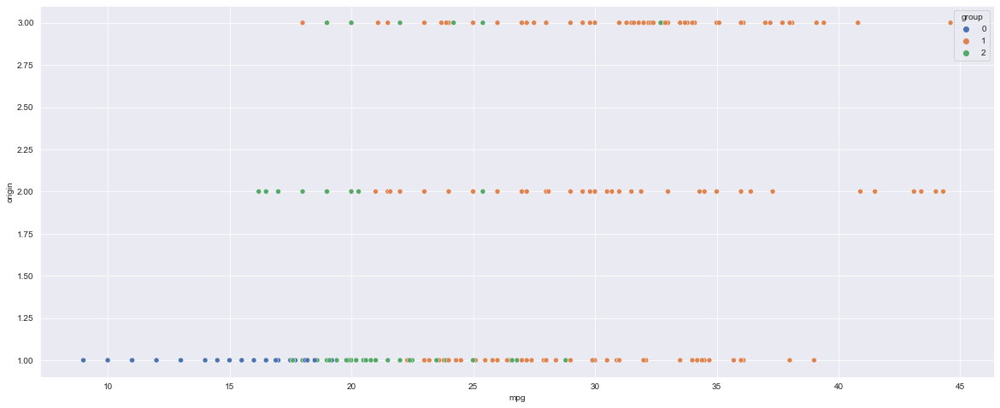

In [80]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="origin", hue="group", palette="deep")

<AxesSubplot:xlabel='mpg', ylabel='hp'>

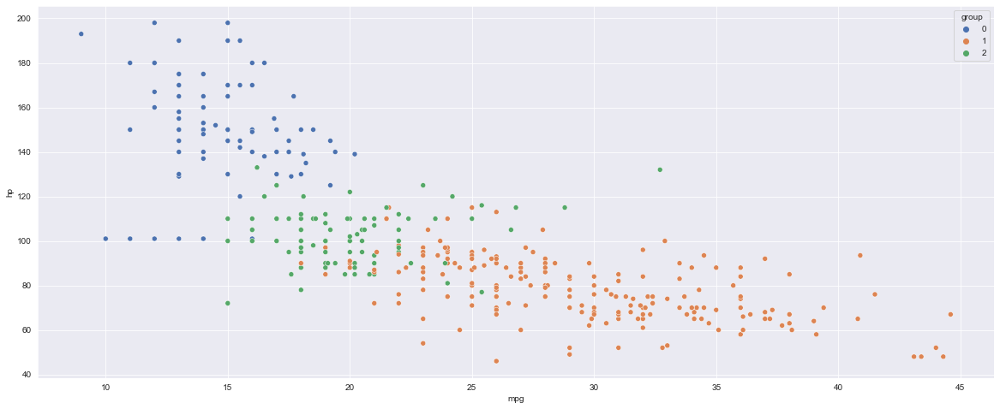

In [81]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="hp", hue="group", palette="deep")

<AxesSubplot:xlabel='mpg', ylabel='wt'>

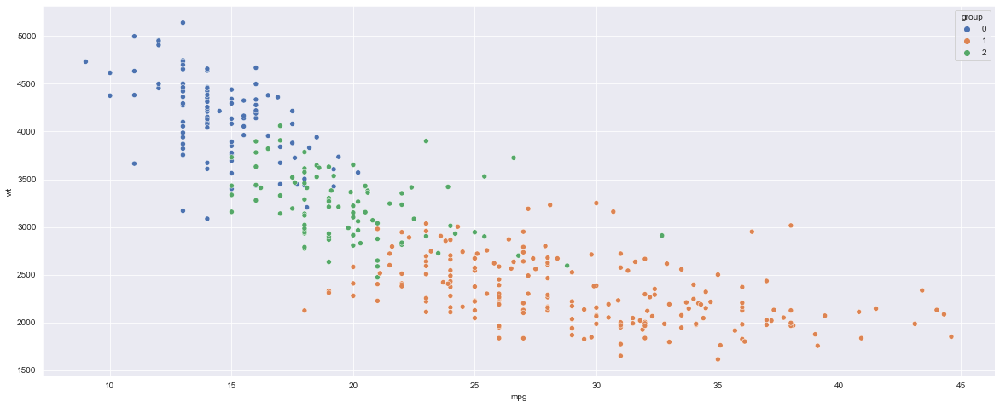

In [82]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="mpg", y="wt", hue="group", palette="deep")

<AxesSubplot:xlabel='wt', ylabel='hp'>

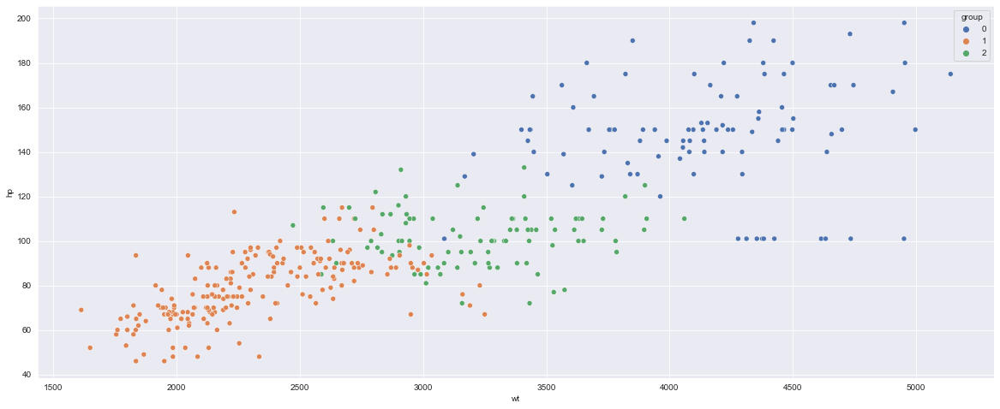

In [83]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=dfa, x="wt", y="hp", hue="group", palette="deep")

### 3G. Pass a new DataPoint and predict which cluster it belongs to.

In [84]:
# Initialize list elements
data = [10, 5, 100, 50, 2000, 21, 70, 1, 'toyota']
  
# Create the pandas DataFrame with column names provided explicitly
new_datapoint = pd.DataFrame([data], columns=['mpg','cyl','disp','hp','wt','acc','yr','origin','car_name'])
  
# Print dataframe.
new_datapoint

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,10,5,100,50,2000,21,70,1,toyota


In [85]:
new_datapoint1=new_datapoint.drop(["yr","origin","car_name"],axis=1)

In [86]:
new_datapoint1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1 entries, 0 to 0
Data columns (total 6 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   mpg     1 non-null      int64
 1   cyl     1 non-null      int64
 2   disp    1 non-null      int64
 3   hp      1 non-null      int64
 4   wt      1 non-null      int64
 5   acc     1 non-null      int64
dtypes: int64(6)
memory usage: 176.0 bytes


In [87]:
# Add cluster numbers to the new datapoint created above
predictions = kmeans.predict(new_datapoint1)

new_datapoint["group"] = predictions
new_datapoint['group'] = new_datapoint['group'].astype('category')
new_datapoint.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name,group
0,10,5,100,50,2000,21,70,1,toyota,0


**We can do similar analysis for 2 groups as well to check if we get more clear distinction among groups.**

# Part-B: Solution

- **DOMAIN:** Automobile
- **CONTEXT:** The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. The vehicle may be viewed from one of many different angles.
- **DATA DESCRIPTION:**
The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more difficult to distinguish between the cars.
 - All the features are numeric i.e. geometric features extracted from the silhouette.
- **PROJECT OBJECTIVE:** Apply dimensionality reduction technique – PCA and train a model and compare relative results.

In [88]:
# Import all the relevant libraries needed to complete the analysis, visualization, modeling and presentation
import pandas as pd
import numpy as np
import os

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline

from scipy import stats
from scipy.stats import zscore

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn import model_selection
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold, KFold
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report 
from sklearn.metrics import ConfusionMatrixDisplay, precision_score, recall_score 
from sklearn.metrics import precision_recall_curve, roc_curve, auc, roc_auc_score
from sklearn.metrics import plot_precision_recall_curve, average_precision_score
from sklearn.metrics import f1_score, plot_roc_curve 

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LinearRegression, LogisticRegression, RidgeClassifier
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from sklearn.svm import SVC

from sklearn.decomposition import PCA

# import xgboost as xgb
# from xgboost import plot_importance
# from catboost import CatBoostClassifier
# from lightgbm import LGBMClassifier

# from sklearn.tree import DecisionTreeClassifier
# from sklearn.ensemble import RandomForestClassifier
# from sklearn.ensemble import AdaBoostClassifier
# from sklearn.ensemble import BaggingClassifier
# from sklearn.ensemble import GradientBoostingClassifier
# from sklearn.ensemble import VotingClassifier

from imblearn.over_sampling import RandomOverSampler
from imblearn.over_sampling import SMOTENC
from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings("ignore")

## 1. Data Understanding and Cleaning:

### 1A. Read ‘vehicle.csv’ and save as DataFrame.

In [89]:
# Read the CSV File 1
dfb=pd.read_csv('vehicle.csv')

In [90]:
dfb.info()
dfb.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [91]:
# Analyze the distribution of the dataset
dfb.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


In [92]:
dfb.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

### 1B. Check percentage of missing values and impute with correct approach.

In [93]:
# Percentage of missing values

# df.isnull().sum()
# df.isna().sum()

def missing_check(df):
    total = df.isnull().sum().sort_values(ascending=False)   # total number of null values
    percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)  # percentage of values that are null
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])  # putting the above two together
    return missing_data # return the dataframe
missing_check(dfb)

,Total,Percent
radius_ratio,6,0.007092
skewness_about,6,0.007092
circularity,5,0.005910
distance_circularity,4,0.004728
scaled_radius_of_gyration.1,4,0.004728
pr.axis_rectangularity,3,0.003546
scaled_variance,3,0.003546
pr.axis_aspect_ratio,2,0.002364
scaled_variance.1,2,0.002364
scaled_radius_of_gyration,2,0.002364


In [94]:
# Replace the missing values with mean values

cols_mean = ['compactness', 'circularity', 'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 
             'pr.axis_rectangularity', 'skewness_about', 'skewness_about.2', 'class']

for cols in cols_mean:
    if(cols != 'class'): 
        dfb[cols] = dfb[cols].fillna(dfb[cols].mean())

In [95]:
# Replace the missing values with median values

cols_median = ['distance_circularity', 'radius_ratio', 'scatter_ratio', 'elongatedness', 
               'max.length_rectangularity','scaled_variance', 'scaled_variance.1', 
               'scaled_radius_of_gyration', 'scaled_radius_of_gyration.1',
               'skewness_about.1', 'hollows_ratio', 'class']

for cols in cols_median:
    if(cols != 'class'): 
        dfb[cols] = dfb[cols].fillna(dfb[cols].median())

In [96]:
dfb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  846 non-null    float64
 2   distance_circularity         846 non-null    float64
 3   radius_ratio                 846 non-null    float64
 4   pr.axis_aspect_ratio         846 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                846 non-null    float64
 7   elongatedness                846 non-null    float64
 8   pr.axis_rectangularity       846 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              846 non-null    float64
 11  scaled_variance.1            846 non-null    float64
 12  scaled_radius_of_gyration    846 non-null    float64
 13  scaled_radius_of_gyr

### 1C. Visualize a Pie-chart and print percentage of values for variable ‘class’.

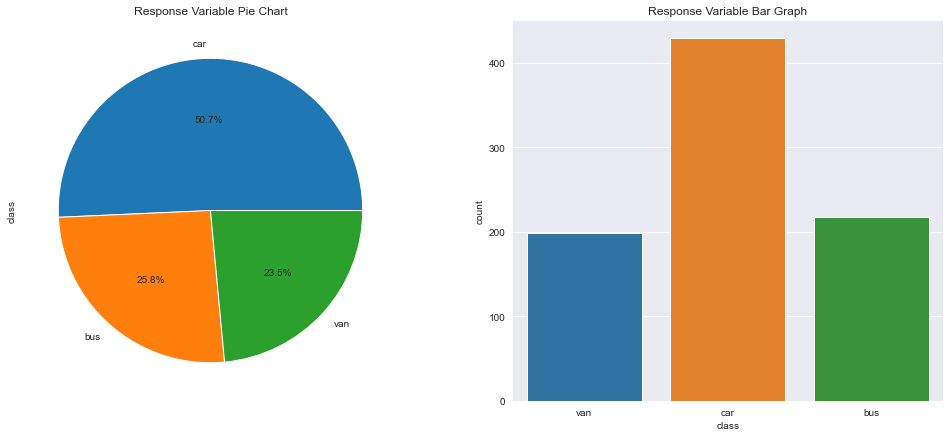

In [97]:
# Understand the target variable and check for imbalanced dataset

f,axes=plt.subplots(1,2,figsize=(17,7))
dfb['class'].value_counts().plot.pie(autopct='%1.1f%%',ax=axes[0])
sns.countplot('class',data=dfb,ax=axes[1])
axes[0].set_title('Response Variable Pie Chart')
axes[1].set_title('Response Variable Bar Graph')
plt.show()

In [98]:
# Group datapoints by class
dfb.groupby(["class"]).count()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
class,,,,,,,,,,,,,,,,,,
bus,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218,218
car,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429,429
van,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199,199


**Insights:**

- Class car has 50.7% of total values followed by Class bus as 25.8% and Class van as 23.5%.
- The above graph shows that the data is biased towards datapoints having class value as car.
- The number of data points of Class car is almost half the number of other two classes ie bus and van.

**There is big imbalance in the target vector.**

If the imbalanced data is not treated beforehand, then this will degrade the performance of the ML model. Most of the predictions will correspond to the majority class and treat the minority class of features as noise in the data and ignore them. This results in a high bias and low performance of the model.

A widely adopted technique for dealing with highly unbalanced datasets is called re-sampling.

**Two widely used re-sampling methods are:**

- Under-sampling: It is the process where you randomly delete some of the observations from the majority class in order to match the numbers with the minority class.
- Over-sampling: It is the process of generating synthetic data that tries to randomly generate a sample of the attributes from observations in the minority class
- Here we will use oversampling because under-sampling may remove important information from the dataset

### 1D. Check for duplicate rows in the data and impute with correct approach.

In [99]:
# To take a look at the duplication in the DataFrame as a whole, just call the duplicated() method on 
# the DataFrame. It outputs True if an entire row is identical to a previous row.
dfb.duplicated().sum()

0

In [100]:
# Count the number of non-duplicates
(~dfb.duplicated()).sum()

846

In [101]:
# Encode the Target Variable
# bus:0; car:1; van:2
le=LabelEncoder()
dfb['class']=le.fit_transform(dfb['class'])
dfb['class'].value_counts()

1    429
0    218
2    199
Name: class, dtype: int64

### Quick EDA

#### Pairplot

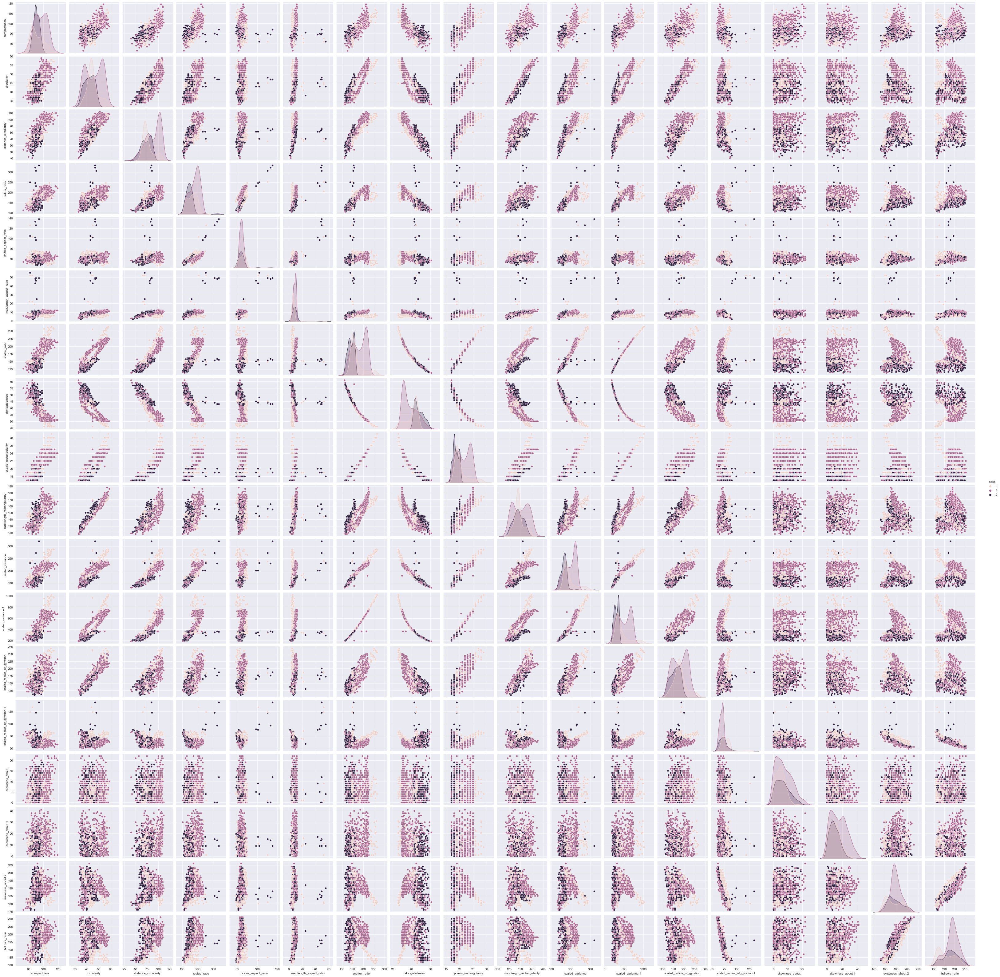

In [102]:
sns.pairplot(dfb, hue="class")

#### Correlation Heatmap

In [103]:
# Checking Correlation Heatmap
plt.figure(dpi = 540,figsize= (30,25))
mask = np.triu(np.ones_like(dfb.corr()))
sns.heatmap(dfb.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

<AxesSubplot:>

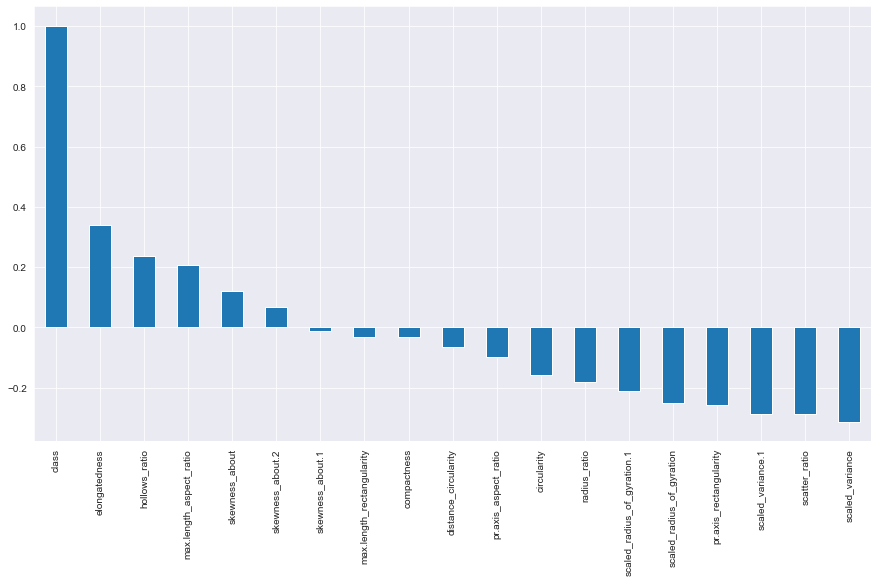

In [104]:
# Correlation of "class" with other features
plt.figure(figsize=(15,8))
dfb.corr()['class'].sort_values(ascending = False).plot(kind='bar')

In [105]:
corr = dfb.corr()
corr

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
compactness,1.000000,0.685421,0.789928,0.689743,0.091704,0.148249,0.812620,-0.788750,0.813636,0.676143,0.762070,0.814012,0.585243,-0.249593,0.235687,0.157015,0.298526,0.365552,-0.033796
circularity,0.685421,1.000000,0.792865,0.620709,0.153362,0.251208,0.848891,-0.822164,0.844972,0.961943,0.797083,0.836984,0.926907,0.053015,0.144394,-0.011851,-0.105645,0.045318,-0.159804
distance_circularity,0.789928,0.792865,1.000000,0.767035,0.158566,0.264686,0.905076,-0.911307,0.893049,0.774527,0.861519,0.886017,0.705771,-0.225944,0.113532,0.265547,0.145987,0.332732,-0.064467
radius_ratio,0.689743,0.620709,0.767035,1.000000,0.663680,0.450052,0.734429,-0.789481,0.708005,0.568949,0.793415,0.718436,0.536372,-0.180397,0.048476,0.173741,0.382087,0.471309,-0.182186
pr.axis_aspect_ratio,0.091704,0.153362,0.158566,0.663680,1.000000,0.648704,0.103906,-0.183244,0.079395,0.127128,0.273094,0.089365,0.122196,0.152994,-0.058481,-0.032195,0.239849,0.267724,-0.098318
max.length_aspect_ratio,0.148249,0.251208,0.264686,0.450052,0.648704,1.000000,0.166191,-0.180140,0.161592,0.305943,0.318957,0.143253,0.189743,0.295735,0.015439,0.043422,-0.026180,0.143919,0.207619
scatter_ratio,0.812620,0.848891,0.905076,0.734429,0.103906,0.166191,1.000000,-0.971601,0.989882,0.809083,0.948662,0.993012,0.799875,-0.027542,0.074302,0.212428,0.005437,0.118817,-0.288895
elongatedness,-0.788750,-0.822164,-0.911307,-0.789481,-0.183244,-0.180140,-0.971601,1.000000,-0.949108,-0.775854,-0.936382,-0.953816,-0.766314,0.103302,-0.052338,-0.185053,-0.114922,-0.216905,0.339344
pr.axis_rectangularity,0.813636,0.844972,0.893049,0.708005,0.079395,0.161592,0.989882,-0.949108,1.000000,0.811447,0.934236,0.988321,0.797120,-0.015366,0.082974,0.214368,-0.018990,0.099191,-0.258479
max.length_rectangularity,0.676143,0.961943,0.774527,0.568949,0.127128,0.305943,0.809083,-0.775854,0.811447,1.000000,0.744985,0.794615,0.866450,0.041622,0.135745,0.001366,-0.104254,0.076770,-0.032399


In [106]:
dfb.var()

compactness                       67.806566
circularity                       37.625259
distance_circularity             247.796994
radius_ratio                    1115.650555
pr.axis_aspect_ratio              62.127792
max.length_aspect_ratio           21.171195
scatter_ratio                   1102.087967
elongatedness                     61.025507
pr.axis_rectangularity             6.699432
max.length_rectangularity        210.704141
scaled_variance                  983.476393
scaled_variance.1              31150.958419
scaled_radius_of_gyration       1059.260119
scaled_radius_of_gyration.1       55.781984
skewness_about                    24.040862
skewness_about.1                  79.762083
skewness_about.2                  37.849145
hollows_ratio                     55.335707
class                              0.492986
dtype: float64

#### Distribution and Outliers

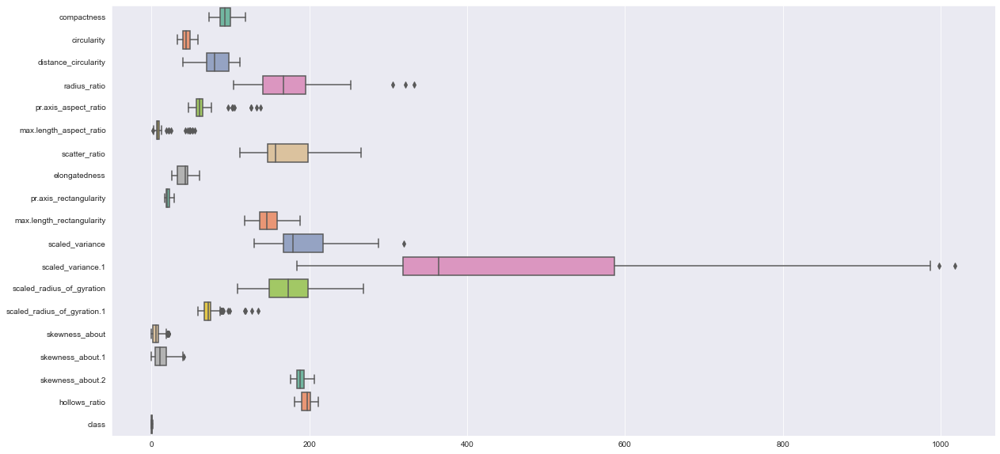

In [107]:
# Single Box Plot
plt.figure(figsize=(20,10))
ax = sns.boxplot(data=dfb, orient="h", palette="Set2")

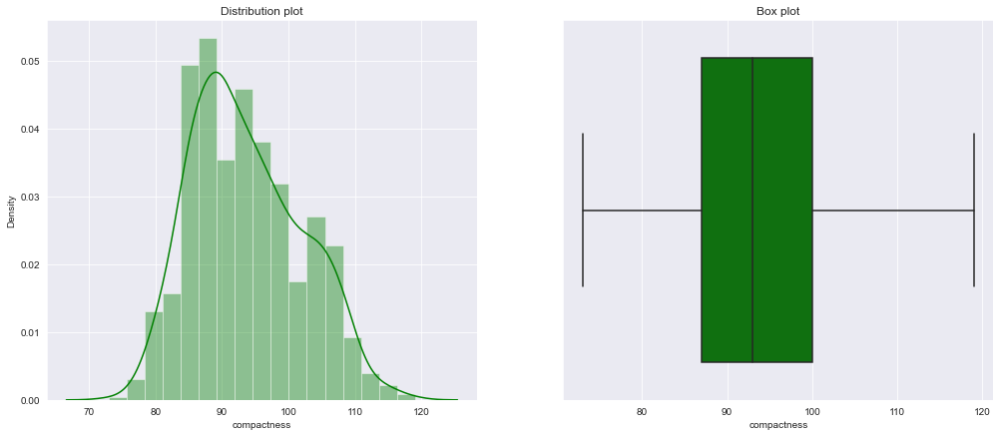

 Total Number of outliers in compactness: 0


In [108]:
# compactness

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['compactness'],  ax=axes[0],color='Green')
sns.boxplot(x = 'compactness', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['compactness'],25),np.percentile(dfb['compactness'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['compactness'] if i < lower or i > upper]
print('{} Total Number of outliers in compactness: {}'.format('\033[1m',len(Outliers)))

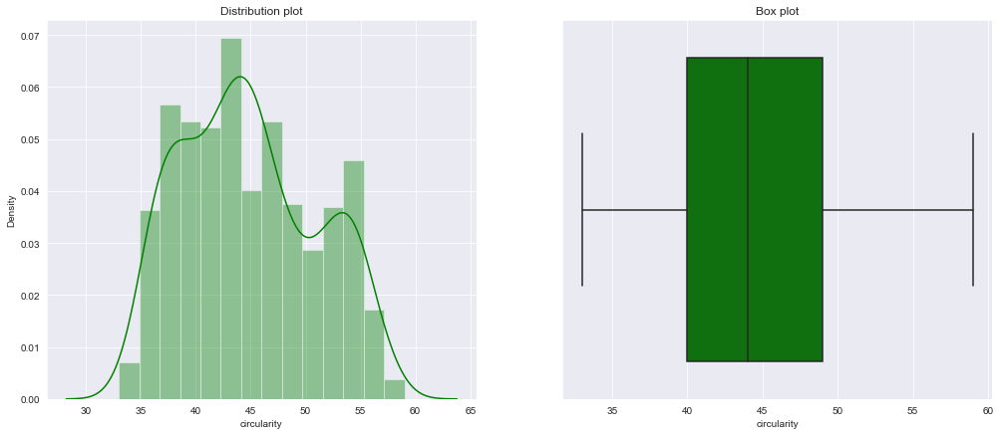

 Total Number of outliers in circularity: 0


In [109]:
# circularity

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['circularity'],  ax=axes[0],color='Green')
sns.boxplot(x = 'circularity', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['circularity'],25),np.percentile(dfb['circularity'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['circularity'] if i < lower or i > upper]
print('{} Total Number of outliers in circularity: {}'.format('\033[1m',len(Outliers)))

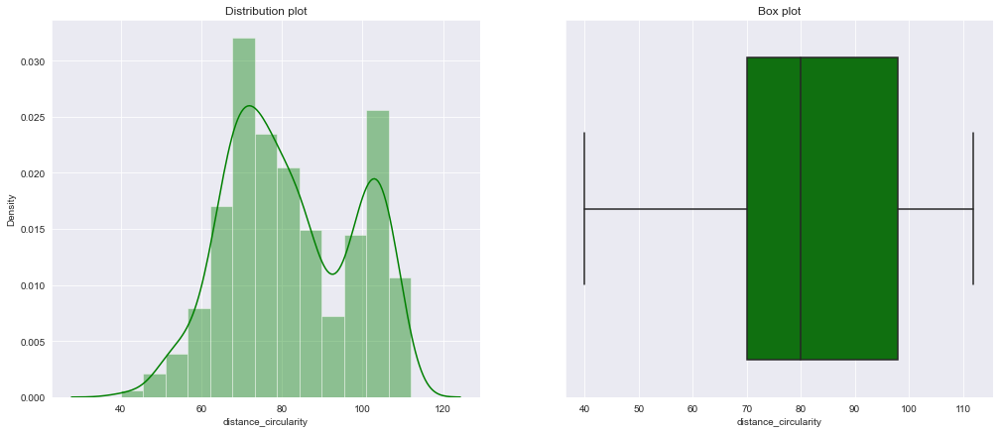

 Total Number of outliers in distance_circularity: 0


In [110]:
# distance_circularity

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['distance_circularity'],  ax=axes[0],color='Green')
sns.boxplot(x = 'distance_circularity', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['distance_circularity'],25),np.percentile(dfb['distance_circularity'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['distance_circularity'] if i < lower or i > upper]
print('{} Total Number of outliers in distance_circularity: {}'.format('\033[1m',len(Outliers)))

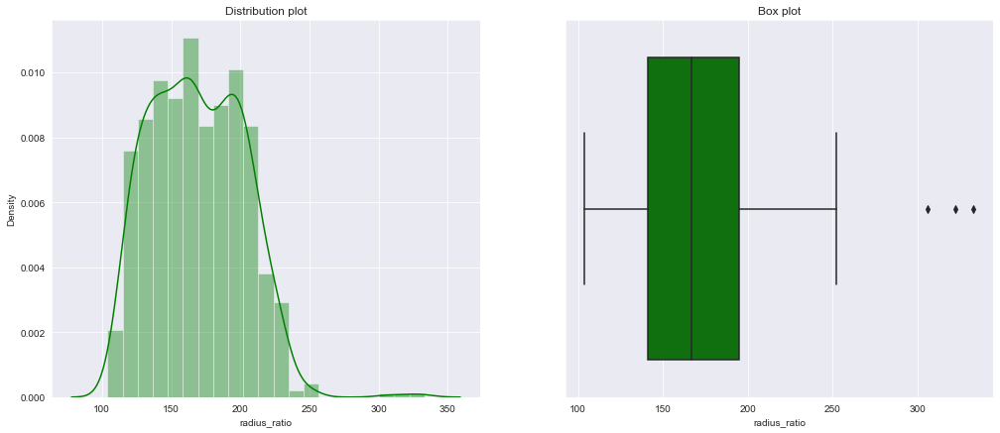

 Total Number of outliers in radius_ratio: 3


In [111]:
# radius_ratio

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['radius_ratio'],  ax=axes[0],color='Green')
sns.boxplot(x = 'radius_ratio', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['radius_ratio'],25),np.percentile(dfb['radius_ratio'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['radius_ratio'] if i < lower or i > upper]
print('{} Total Number of outliers in radius_ratio: {}'.format('\033[1m',len(Outliers)))

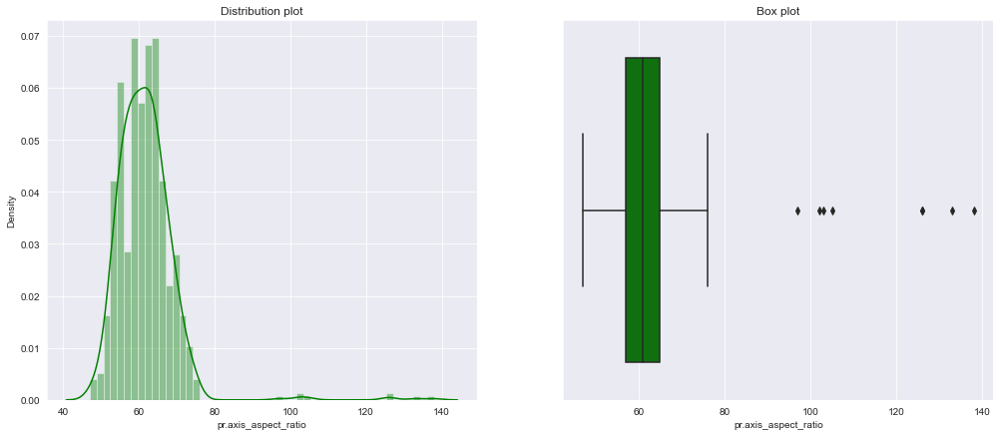

 Total Number of outliers in pr.axis_aspect_ratio: 8


In [112]:
# pr.axis_aspect_ratio

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['pr.axis_aspect_ratio'],  ax=axes[0],color='Green')
sns.boxplot(x = 'pr.axis_aspect_ratio', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['pr.axis_aspect_ratio'],25),np.percentile(dfb['pr.axis_aspect_ratio'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['pr.axis_aspect_ratio'] if i < lower or i > upper]
print('{} Total Number of outliers in pr.axis_aspect_ratio: {}'.format('\033[1m',len(Outliers)))

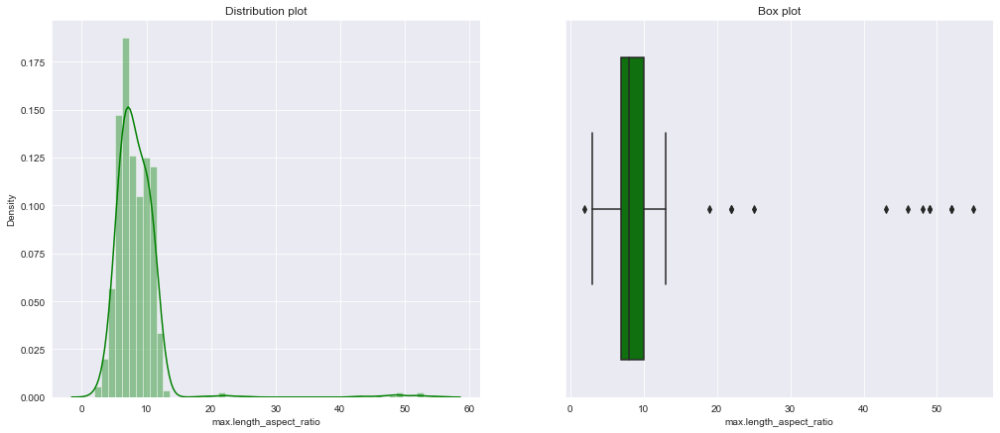

 Total Number of outliers in max.length_aspect_ratio: 13


In [113]:
# max.length_aspect_ratio

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['max.length_aspect_ratio'],  ax=axes[0],color='Green')
sns.boxplot(x = 'max.length_aspect_ratio', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['max.length_aspect_ratio'],25),np.percentile(dfb['max.length_aspect_ratio'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['max.length_aspect_ratio'] if i < lower or i > upper]
print('{} Total Number of outliers in max.length_aspect_ratio: {}'.format('\033[1m',len(Outliers)))

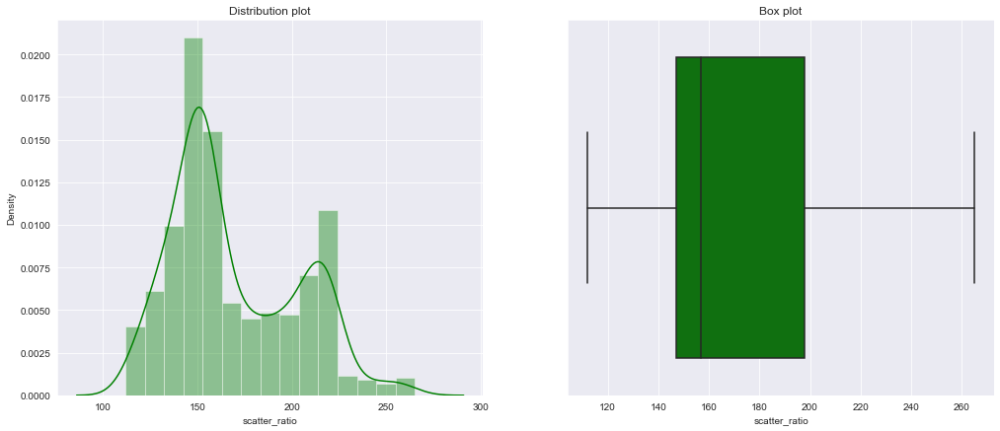

 Total Number of outliers in scatter_ratio: 0


In [114]:
# scatter_ratio

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['scatter_ratio'],  ax=axes[0],color='Green')
sns.boxplot(x = 'scatter_ratio', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['scatter_ratio'],25),np.percentile(dfb['scatter_ratio'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['scatter_ratio'] if i < lower or i > upper]
print('{} Total Number of outliers in scatter_ratio: {}'.format('\033[1m',len(Outliers)))

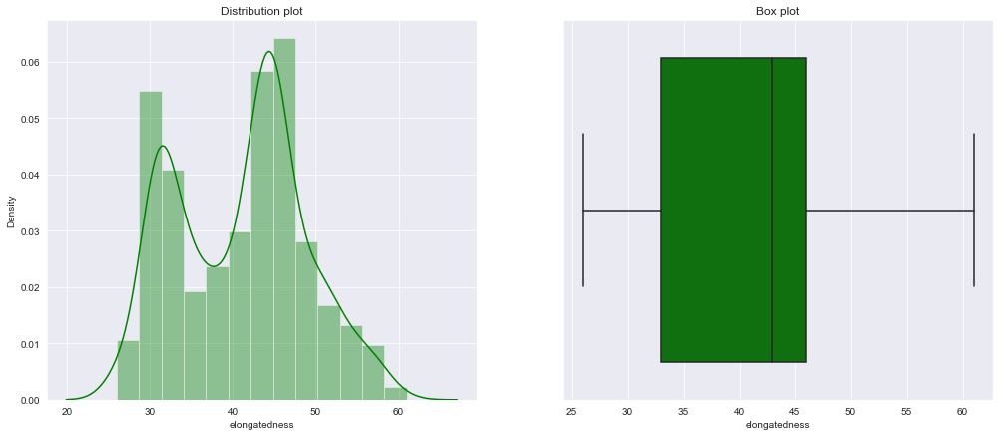

 Total Number of outliers in elongatedness: 0


In [115]:
# elongatedness

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['elongatedness'],  ax=axes[0],color='Green')
sns.boxplot(x = 'elongatedness', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['elongatedness'],25),np.percentile(dfb['elongatedness'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['elongatedness'] if i < lower or i > upper]
print('{} Total Number of outliers in elongatedness: {}'.format('\033[1m',len(Outliers)))

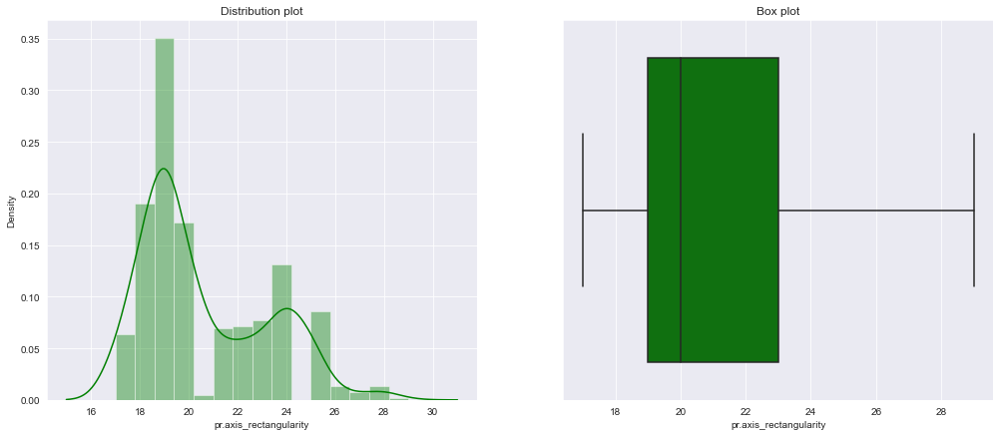

 Total Number of outliers in pr.axis_rectangularity: 0


In [116]:
# pr.axis_rectangularity

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['pr.axis_rectangularity'],  ax=axes[0],color='Green')
sns.boxplot(x = 'pr.axis_rectangularity', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['pr.axis_rectangularity'],25),np.percentile(dfb['pr.axis_rectangularity'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['pr.axis_rectangularity'] if i < lower or i > upper]
print('{} Total Number of outliers in pr.axis_rectangularity: {}'.format('\033[1m',len(Outliers)))

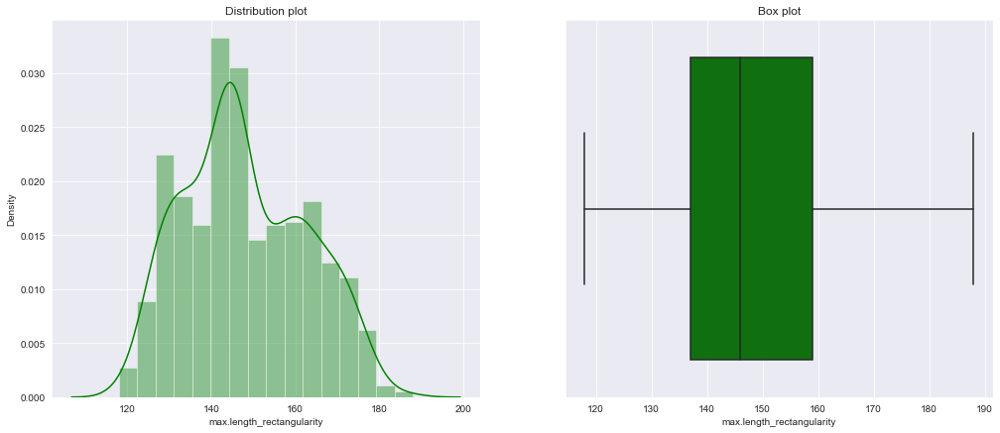

 Total Number of outliers in max.length_rectangularity: 0


In [117]:
# max.length_rectangularity

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['max.length_rectangularity'],  ax=axes[0],color='Green')
sns.boxplot(x = 'max.length_rectangularity', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['max.length_rectangularity'],25),np.percentile(dfb['max.length_rectangularity'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['max.length_rectangularity'] if i < lower or i > upper]
print('{} Total Number of outliers in max.length_rectangularity: {}'.format('\033[1m',len(Outliers)))

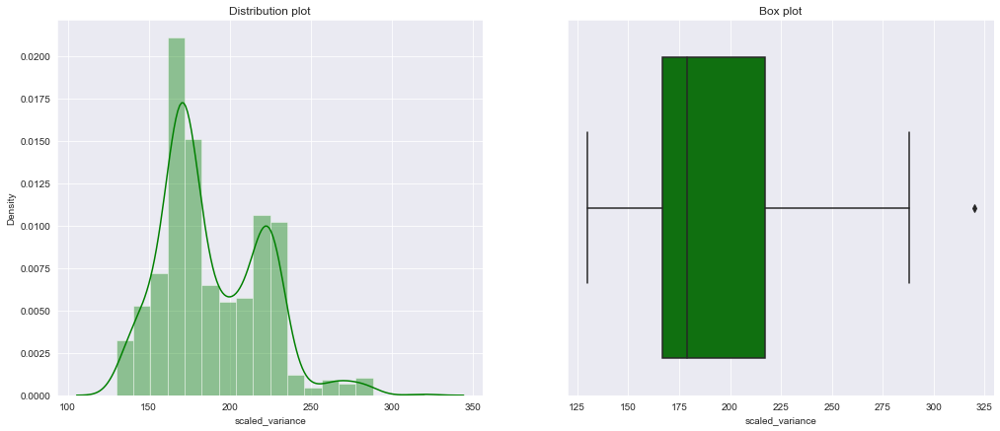

 Total Number of outliers in scaled_variance: 1


In [118]:
# scaled_variance

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['scaled_variance'],  ax=axes[0],color='Green')
sns.boxplot(x = 'scaled_variance', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['scaled_variance'],25),np.percentile(dfb['scaled_variance'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['scaled_variance'] if i < lower or i > upper]
print('{} Total Number of outliers in scaled_variance: {}'.format('\033[1m',len(Outliers)))

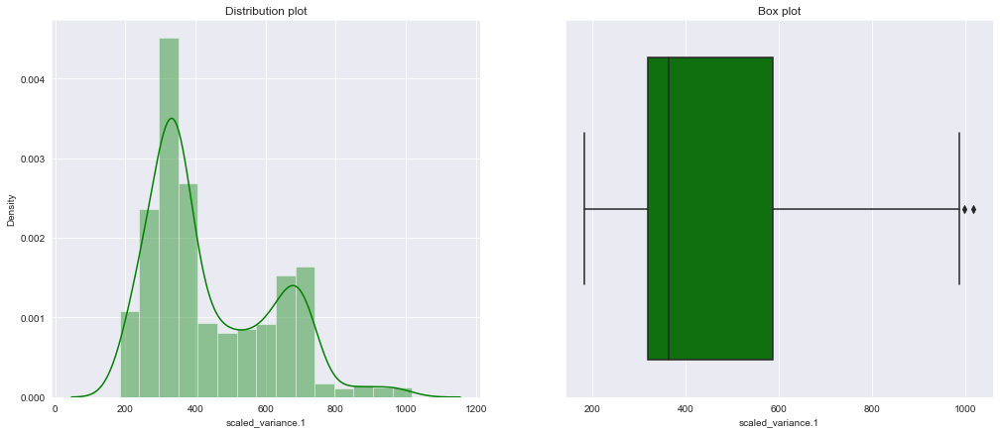

 Total Number of outliers in scaled_variance.1: 2


In [119]:
# scaled_variance.1

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['scaled_variance.1'],  ax=axes[0],color='Green')
sns.boxplot(x = 'scaled_variance.1', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['scaled_variance.1'],25),np.percentile(dfb['scaled_variance.1'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['scaled_variance.1'] if i < lower or i > upper]
print('{} Total Number of outliers in scaled_variance.1: {}'.format('\033[1m',len(Outliers)))

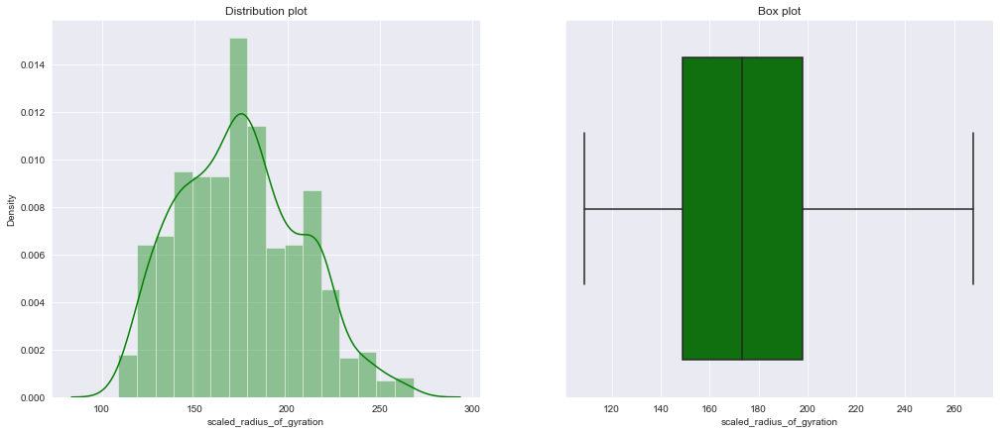

 Total Number of outliers in scaled_radius_of_gyration: 0


In [120]:
# scaled_radius_of_gyration

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['scaled_radius_of_gyration'],  ax=axes[0],color='Green')
sns.boxplot(x = 'scaled_radius_of_gyration', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['scaled_radius_of_gyration'],25),np.percentile(dfb['scaled_radius_of_gyration'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['scaled_radius_of_gyration'] if i < lower or i > upper]
print('{} Total Number of outliers in scaled_radius_of_gyration: {}'.format('\033[1m',len(Outliers)))

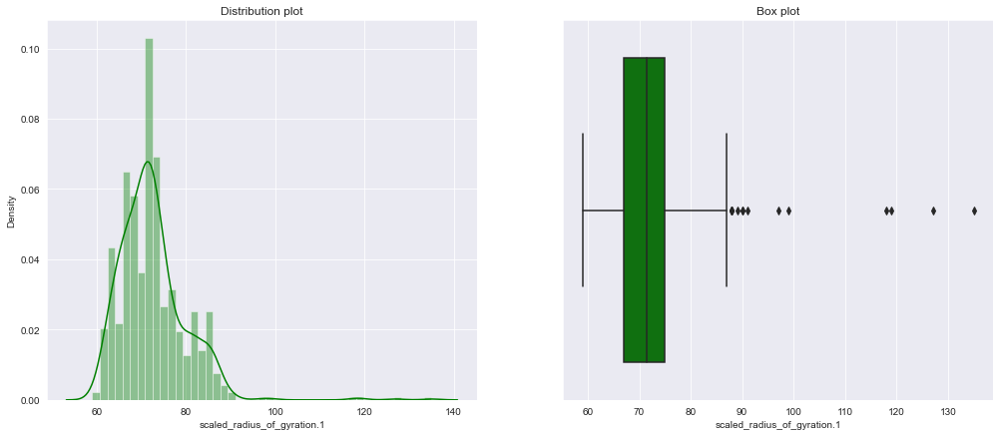

 Total Number of outliers in scaled_radius_of_gyration.1: 15


In [121]:
# scaled_radius_of_gyration.1

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['scaled_radius_of_gyration.1'],  ax=axes[0],color='Green')
sns.boxplot(x = 'scaled_radius_of_gyration.1', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['scaled_radius_of_gyration.1'],25),np.percentile(dfb['scaled_radius_of_gyration.1'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['scaled_radius_of_gyration.1'] if i < lower or i > upper]
print('{} Total Number of outliers in scaled_radius_of_gyration.1: {}'.format('\033[1m',len(Outliers)))

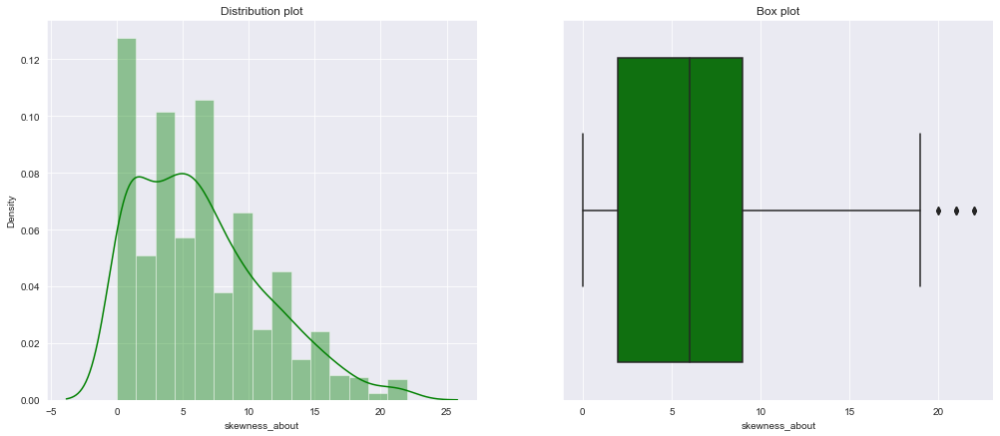

 Total Number of outliers in skewness_about: 12


In [122]:
# skewness_about

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['skewness_about'],  ax=axes[0],color='Green')
sns.boxplot(x = 'skewness_about', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['skewness_about'],25),np.percentile(dfb['skewness_about'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['skewness_about'] if i < lower or i > upper]
print('{} Total Number of outliers in skewness_about: {}'.format('\033[1m',len(Outliers)))

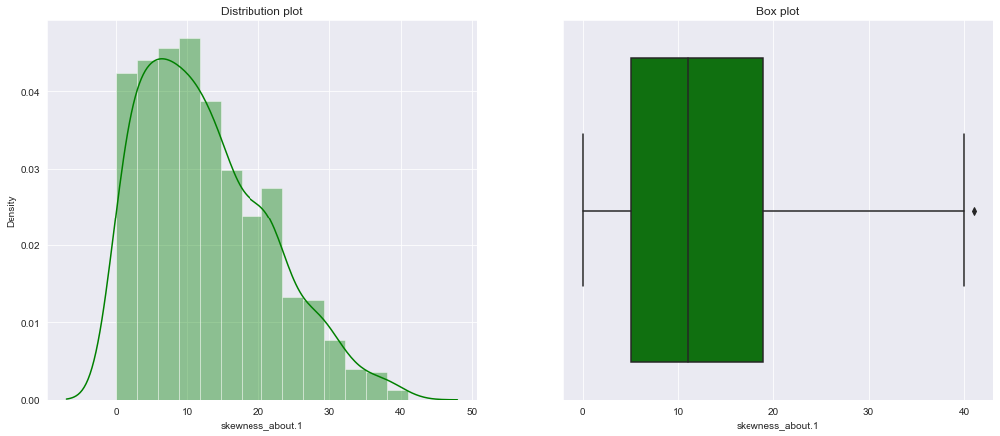

 Total Number of outliers in skewness_about.1: 1


In [123]:
# skewness_about.1

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['skewness_about.1'],  ax=axes[0],color='Green')
sns.boxplot(x = 'skewness_about.1', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['skewness_about.1'],25),np.percentile(dfb['skewness_about.1'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['skewness_about.1'] if i < lower or i > upper]
print('{} Total Number of outliers in skewness_about.1: {}'.format('\033[1m',len(Outliers)))

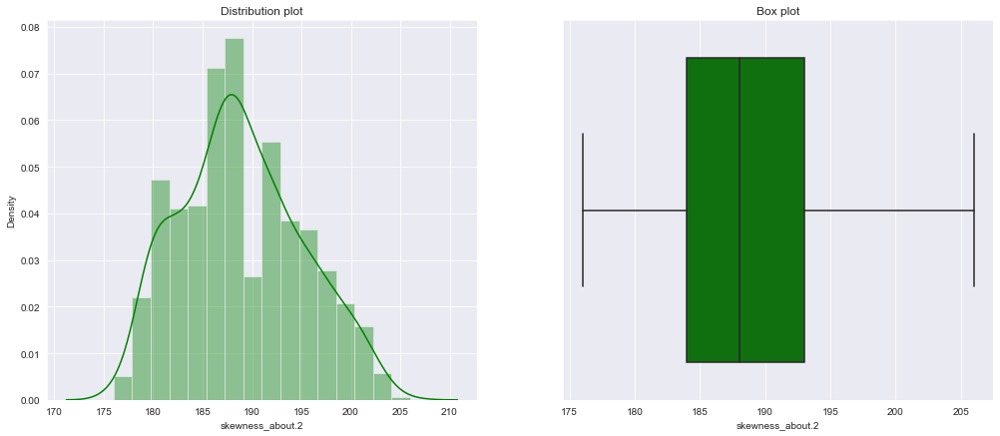

 Total Number of outliers in skewness_about.2: 0


In [124]:
# skewness_about.2

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['skewness_about.2'],  ax=axes[0],color='Green')
sns.boxplot(x = 'skewness_about.2', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['skewness_about.2'],25),np.percentile(dfb['skewness_about.2'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['skewness_about.2'] if i < lower or i > upper]
print('{} Total Number of outliers in skewness_about.2: {}'.format('\033[1m',len(Outliers)))

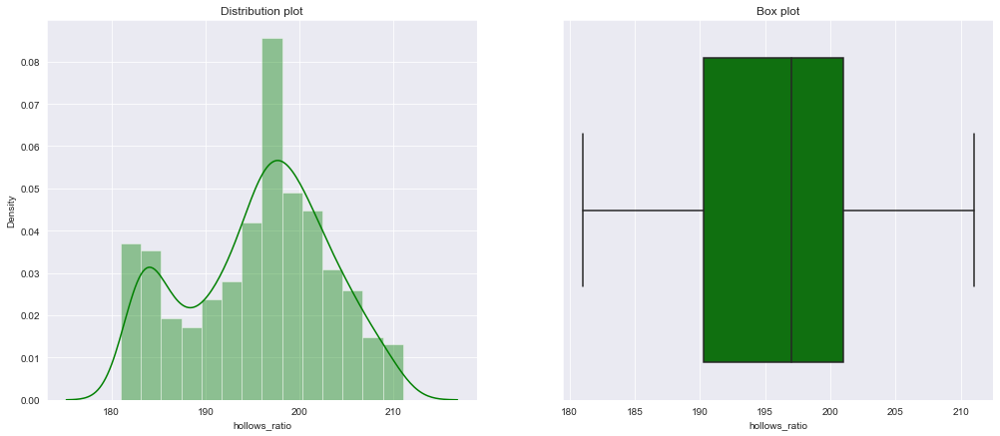

 Total Number of outliers in hollows_ratio: 0


In [125]:
# hollows_ratio

# Distribution and box plot
f, axes = plt.subplots(1, 2, figsize=(17,7))
sns.distplot(dfb['hollows_ratio'],  ax=axes[0],color='Green')
sns.boxplot(x = 'hollows_ratio', data=dfb,  orient='h' , ax=axes[1],color='Green')
axes[0].set_title('Distribution plot')
axes[1].set_title('Box plot')
plt.show()

# Outlier detection
q25,q75=np.percentile(dfb['hollows_ratio'],25),np.percentile(dfb['hollows_ratio'],75)
IQR=q75-q25
Threshold=IQR*1.5
lower,upper=q25-Threshold,q75+Threshold
Outliers=[i for i in dfb['hollows_ratio'] if i < lower or i > upper]
print('{} Total Number of outliers in hollows_ratio: {}'.format('\033[1m',len(Outliers)))

#### Remove Outliers

In [126]:
# Impute outliers with mean

col=['radius_ratio',
'pr.axis_aspect_ratio', 
'max.length_aspect_ratio', 
'scaled_variance', 
'scaled_variance.1', 
'scaled_radius_of_gyration.1', 
'skewness_about', 
'skewness_about.1'
]

for c in col:
    # Use the IQR method
    q25,q75=np.percentile(dfb[c],25),np.percentile(dfb[c],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in dfb[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',c,len(Outliers)))
    # Mean of the column without considering the outliers
    dfb_include = dfb.loc[(dfb[c] >= lower) & (dfb[c] <= upper)]
    mean=int(dfb_include[c].mean())
    print('{} Mean of {} is {}'.format('\033[1m',c,mean))
    # Impute outliers with mean
    dfb[c]=np.where(dfb[c]>upper,mean,dfb[c])
    dfb[c]=np.where(dfb[c]<lower,mean,dfb[c])
    Outliers=[i for i in dfb[c] if i < lower or i > upper]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',c,len(Outliers)))  
    print('\n')

 Total Number of outliers in radius_ratio Before Imputing : 3
 Mean of radius_ratio is 168
 Total Number of outliers in radius_ratio After Imputing : 0


 Total Number of outliers in pr.axis_aspect_ratio Before Imputing : 8
 Mean of pr.axis_aspect_ratio is 61
 Total Number of outliers in pr.axis_aspect_ratio After Imputing : 0


 Total Number of outliers in max.length_aspect_ratio Before Imputing : 13
 Mean of max.length_aspect_ratio is 8
 Total Number of outliers in max.length_aspect_ratio After Imputing : 0


 Total Number of outliers in scaled_variance Before Imputing : 1
 Mean of scaled_variance is 188
 Total Number of outliers in scaled_variance After Imputing : 0


 Total Number of outliers in scaled_variance.1 Before Imputing : 2
 Mean of scaled_variance.1 is 437
 Total Number of outliers in scaled_variance.1 After Imputing : 0


 Total Number of outliers in scaled_radius_of_gyration.1 Before Imputing : 15
 Mean of scaled_radius_of_gyration.1 is 71
 Total Number of outliers in s

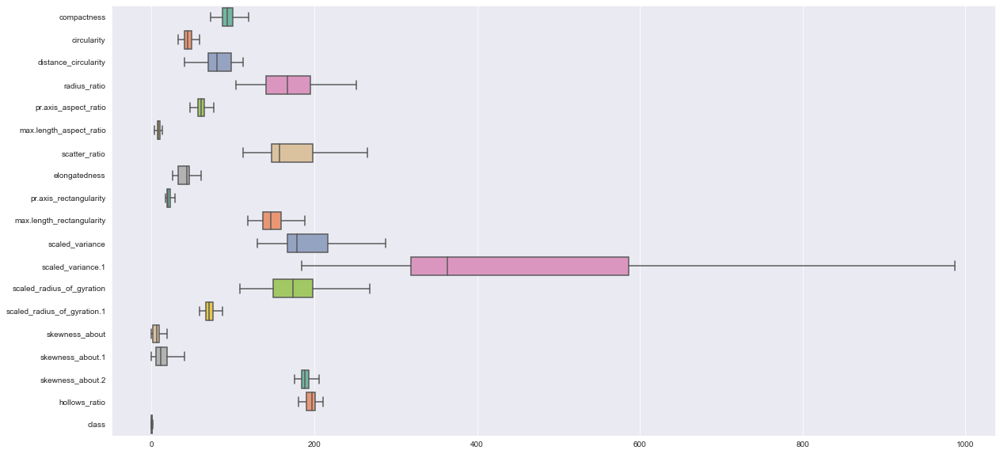

In [127]:
# Single Box Plot after removing outliers
plt.figure(figsize=(20,10))
ax = sns.boxplot(data=dfb, orient="h", palette="Set2")

In [128]:
dfb.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,2
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,2
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,1
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,2
4,85,44.0,70.0,205.0,61.0,8,149.0,45.0,19.0,144,241.0,325.0,188.0,71.0,9.0,11.0,180.0,183,0


In [129]:
dfb.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  846 non-null    float64
 2   distance_circularity         846 non-null    float64
 3   radius_ratio                 846 non-null    float64
 4   pr.axis_aspect_ratio         846 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                846 non-null    float64
 7   elongatedness                846 non-null    float64
 8   pr.axis_rectangularity       846 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              846 non-null    float64
 11  scaled_variance.1            846 non-null    float64
 12  scaled_radius_of_gyration    846 non-null    float64
 13  scaled_radius_of_gyr

## 2. Data Preparation:

### 2A. Split data into X and Y. [Train and Test optional]

In [130]:
# Arrange data into independent variables and dependent variables
X=dfb.drop(columns='class')
y=dfb['class'] # Target Vector

In [131]:
# Split X and y into training and test set in 80:20 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=0)

### 2B. Standardize the Data.

In [132]:
# Using different scaling methods:
# scaler = RobustScaler()
# scaler = MinMaxScaler()
scaler = StandardScaler()

cols_to_scale = ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']

X_train[cols_to_scale] = scaler.fit_transform(X_train[cols_to_scale])
X_test[cols_to_scale] = scaler.transform(X_test[cols_to_scale])

In [133]:
X_train.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
252,-1.168085,-0.144456,-0.115053,-0.857504,-0.560629,1.400180,-0.374045,0.378655,-0.210204,0.613763,-0.716188,-0.499889,0.030331,0.302774,-0.254430,0.543623,-0.946541,-0.318109
389,0.801977,1.990970,1.617583,1.210000,0.327474,1.400180,1.787884,-1.425772,1.748427,2.205289,1.487408,1.847414,0.936061,-0.028282,-0.036841,0.775624,-0.448713,0.372455
503,-0.306183,-0.965774,-0.628427,-1.073511,-1.093491,-0.533470,-0.678542,0.636431,-0.601930,-1.116156,-0.586565,-0.701746,-0.812935,0.799357,0.615926,0.659623,-0.780599,-0.870560
2,1.294493,0.841125,1.553411,1.271716,0.860335,0.916767,1.178890,-1.167997,0.964975,0.682960,1.130944,1.149567,1.404543,0.137246,1.703872,-0.384380,-0.116828,0.096229
837,0.063204,0.184071,-0.307569,0.037386,-0.205388,-0.050057,-0.313145,0.120880,-0.210204,-0.009008,-0.230101,-0.361473,0.186492,-0.855921,1.268694,-1.196382,0.712886,0.510568


In [134]:
X_test.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
506,0.925106,1.005389,1.938441,1.024850,-0.383009,1.400180,1.392038,-1.167997,1.356701,0.959747,1.130944,1.334122,0.592509,-1.186977,-1.342376,2.747629,0.215058,1.477357
222,0.801977,0.841125,-0.050882,0.901417,0.092821,-1.016882,0.539446,-0.910222,0.573249,0.682960,0.580045,0.549765,0.717437,0.302774,0.042423,-1.312383,1.376657,0.372455
612,-1.660601,-1.787092,-2.553579,-1.783252,-0.738250,-2.467119,-1.652932,2.311970,-1.385382,-2.015715,-1.850392,-1.411127,-1.687433,2.454636,-0.472020,-0.616381,-1.610312,-1.699236
730,0.925106,1.662443,1.617583,0.993992,-0.027767,1.400180,1.726984,-1.425772,1.748427,2.066896,1.292973,1.697463,0.904829,0.302774,0.398337,2.631629,-0.282770,0.786793
661,2.033266,0.184071,1.168381,0.901417,-0.027767,0.433355,0.752594,-0.910222,0.573249,0.060189,0.677263,0.722785,-0.469382,-1.186977,1.051105,-0.616381,0.878829,1.063018


In [135]:
y_train.head()

252    2
389    1
503    1
2      1
837    1
Name: class, dtype: int32

In [136]:
y_test.head()

506    1
222    0
612    1
730    1
661    1
Name: class, dtype: int32

## 3. Model Building:

### 3A. Train a base Classification model using SVM.

In [137]:
# Create svm_model Object
svm_model = SVC()

# Training the model
svm_model.fit(X_train, y_train)

# Predict testing set
y_pred = svm_model.predict(X_test)

### 3B. Print Classification metrics for train data.

Accuracy on Training data: 0.9763313609467456
Accuracy on Test data: 0.9647058823529412
Classification Report:
               precision    recall  f1-score   support

           0       0.97      0.97      0.97        40
           1       0.97      0.97      0.97        95
           2       0.94      0.94      0.94        35

    accuracy                           0.96       170
   macro avg       0.96      0.96      0.96       170
weighted avg       0.96      0.96      0.96       170

Confusion Matrix Chart:


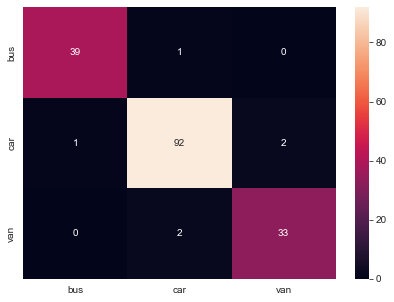

In [138]:
# Classification Accuracy
print('Accuracy on Training data:',svm_model.score(X_train, y_train))
print('Accuracy on Test data:',svm_model.score(X_test, y_test))

# Classification Report
print("Classification Report:\n",classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix Chart:")
cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2])
df_cm = pd.DataFrame(cm, index = [i for i in ["bus","car","van"]],
                  columns = [i for i in ["bus","car","van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')
plt.show()

In [139]:
# Model comparison and K Fold Cross Validation test
model = svm_model
y_pred = model.predict(X_test)
y1_pred = model.predict(X_train)
accuracies = cross_val_score(estimator= model, X = X_train, y = y_train, cv=10)

precision = precision_score(y_test,y_pred, average='macro')
recall = recall_score(y_test,y_pred, average='macro')
f1 = f1_score(y_test,y_pred, average='macro')

Train_Accuracy = accuracy_score(y_train,y1_pred)*100
Test_Accuracy = accuracy_score(y_test,y_pred)*100
K_Fold_Mean_Accuracy = accuracies.mean()*100
Std_Deviation = accuracies.std()*100

base_1 = []
base_1.append(['SVM All Variables Base Model', Train_Accuracy, Test_Accuracy, K_Fold_Mean_Accuracy, Std_Deviation, precision,
               recall, f1])
model_comparison = pd.DataFrame(base_1,columns=['Model','Train Accuracy','Test Accuracy','K-Fold Mean Accuracy',
                                                'Std. Deviation', 'Precision','Recall','F1 Score'])
model_comparison.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)

### 3C. Apply PCA on the data with 10 components.

In [140]:
# Scaling the complete feature matrix
X = scaler.fit_transform(X)

In [141]:
# Calculating the covariance between attributes after scaling
# Covariance indicates the level to which two variables vary together.
cov_matrix = np.cov(X,rowvar=False)
print('Covariance Matrix:')
print(cov_matrix)

Covariance Matrix:
[[ 1.00118343  0.68623251  0.79086299  0.72274587  0.19332811  0.50051942
   0.81358214 -0.78968322  0.81459888  0.67694334  0.77083712  0.80933908
   0.58593517 -0.24594949  0.19711609  0.15658904  0.2988797   0.36598446]
 [ 0.68623251  1.00118343  0.79380348  0.63888428  0.20297793  0.5607299
   0.84989596 -0.82313725  0.84597164  0.96308094  0.80467434  0.83182402
   0.92800403  0.07048256  0.13675532 -0.01015177 -0.1057698   0.04537164]
 [ 0.79086299  0.79380348  1.00118343  0.79518245  0.24477217  0.66759792
   0.90614687 -0.9123854   0.89410614  0.77544391  0.87072431  0.88666518
   0.70660663 -0.22858843  0.09880044  0.26282025  0.14615943  0.33312625]
 [ 0.72274587  0.63888428  0.79518245  1.00118343  0.65165242  0.46450248
   0.77080917 -0.82633716  0.74458779  0.58023162  0.78729174  0.76167966
   0.5514712  -0.39120209  0.03548986  0.17989116  0.40614361  0.49232718]
 [ 0.19332811  0.20297793  0.24477217  0.65165242  1.00118343  0.15045483
   0.1946657  -0

In [142]:
# Use PCA on 10 components
pca10 = PCA(n_components=10, random_state=0)
pca10.fit(X)

PCA(n_components=10, random_state=0)

In [143]:
# The eigen Values
print(pca10.explained_variance_)

[9.75434703 3.35065682 1.19258797 1.13382684 0.8839616  0.66624591
 0.31757509 0.22869528 0.13246984 0.07967907]


In [144]:
# The eigen Vectors
print(pca10.components_)

[[ 0.27242621  0.2874119   0.30232468  0.26954275  0.09774549  0.19503114
   0.31050809 -0.30894161  0.30731723  0.27813695  0.29977554  0.30604902
   0.26328707 -0.04149436  0.03596318  0.05865312  0.03774025  0.08448782]
 [-0.08734011  0.1319823  -0.0465069  -0.19852083 -0.25803986 -0.10827759
   0.07492999 -0.01285973  0.08741731  0.1217793   0.07669869  0.07246658
   0.21019169  0.50327713 -0.01561269 -0.0929281  -0.50162947 -0.50764602]
 [-0.03738182 -0.20110663  0.06413458  0.05470048 -0.06572916 -0.14732636
   0.10906013 -0.09052069  0.10609682 -0.21334439  0.1438746   0.11035328
  -0.20326854  0.07336692 -0.55741334  0.67253664 -0.06228027 -0.0411697 ]
 [ 0.1387816  -0.03682193  0.10859388 -0.25454776 -0.61247168  0.27963908
   0.00478337  0.06576229  0.0302556   0.04255843 -0.06464092 -0.00258968
  -0.08452759 -0.11555214  0.47654184  0.42496924 -0.02669905  0.09652292]
 [ 0.13713056 -0.13819988 -0.08017083  0.13328031  0.1229622  -0.63555893
   0.08570926 -0.07908724  0.08072

In [145]:
# And the percentage of variation explained by each eigen Vector
print(pca10.explained_variance_ratio_)

[0.54126761 0.18592757 0.06617657 0.06291592 0.04905093 0.03696991
 0.01762221 0.01269028 0.00735074 0.00442138]


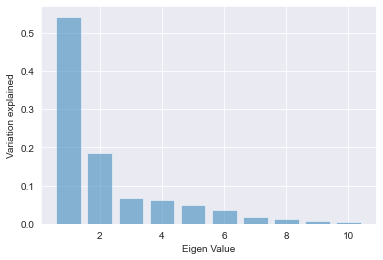

In [146]:
# Variation explained by each component
plt.bar(list(range(1,11)),pca10.explained_variance_ratio_,alpha=0.5, align='center')
plt.ylabel('Variation explained')
plt.xlabel('Eigen Value')
plt.show()

### 3D. Visualize Cumulative Variance Explained with Number of Components.

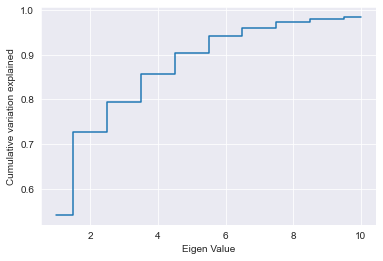

In [147]:
# Cumulative Variation explained by each component
plt.step(list(range(1,11)),np.cumsum(pca10.explained_variance_ratio_), where='mid')
plt.ylabel('Cumulative variation explained')
plt.xlabel('Eigen Value')
plt.show()

### 3E. Draw a horizontal line on the above plot to highlight the threshold of 90%.

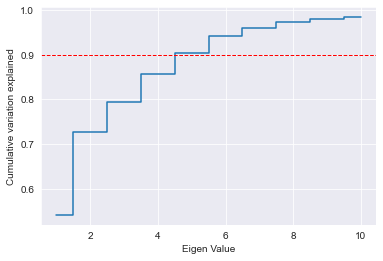

In [148]:
# Cumulative Variation explained by each component
# Red dashed line at 90% cumulative variation is explained by 5 principal components
plt.step(list(range(1,11)),np.cumsum(pca10.explained_variance_ratio_), where='mid')
plt.axhline(y=0.9, color='r', linestyle='--', lw=1)
plt.ylabel('Cumulative variation explained')
plt.xlabel('Eigen Value')
plt.show()

# Now 5 dimensions seems very reasonable. With 5 variables we can explain over 90% of the 
# variation in the original data!

### 3F. Apply PCA on the data. This time Select Minimum Components with 90% or above variance explained.

In [149]:
# 5 principal components are able to explain more than 90% of variance in the data
pca5 = PCA(n_components=5)
pca5.fit(X)
print(pca5.components_)
print(pca5.explained_variance_ratio_)
Xpca5 = pca5.transform(X)

[[ 0.27242621  0.2874119   0.30232468  0.26954275  0.09774549  0.19503114
   0.31050809 -0.30894161  0.30731723  0.27813695  0.29977554  0.30604902
   0.26328707 -0.04149436  0.03596318  0.05865312  0.03774025  0.08448782]
 [-0.08734011  0.1319823  -0.0465069  -0.19852083 -0.25803986 -0.10827759
   0.07492999 -0.01285973  0.08741731  0.1217793   0.07669869  0.07246658
   0.21019169  0.50327713 -0.01561269 -0.0929281  -0.50162947 -0.50764602]
 [-0.03738182 -0.20110663  0.06413458  0.05470048 -0.06572916 -0.14732636
   0.10906013 -0.09052069  0.10609682 -0.21334439  0.1438746   0.11035328
  -0.20326854  0.07336692 -0.55741334  0.67253664 -0.06228027 -0.04116969]
 [ 0.1387816  -0.03682193  0.10859388 -0.25454776 -0.61247168  0.27963908
   0.00478337  0.06576229  0.0302556   0.04255843 -0.06464092 -0.00258968
  -0.08452759 -0.11555214  0.47654184  0.42496924 -0.02669905  0.09652292]
 [ 0.13713056 -0.13819989 -0.08017084  0.13328031  0.1229622  -0.63555893
   0.08570926 -0.07908724  0.08072

In [150]:
# Print the original features and the reduced features
print('Original number of features:', X.shape[1])
print('Reduced number of features:', Xpca5.shape[1])

Original number of features: 18
Reduced number of features: 5


In [151]:
# View the first 5 observations of the pca components
Xpca5_df = pd.DataFrame(data = Xpca5)
Xpca5_df.head()

,0,1,2,3,4
0,0.582503,-0.675955,-0.457698,-0.748545,-0.779823
1,-1.513738,-0.347311,-0.326278,1.270415,-0.325654
2,3.912479,0.232406,-1.265696,0.143719,0.912849
3,-1.538353,-3.042279,-0.467336,0.327081,-0.611684
4,-0.639347,1.447634,-0.256540,-0.541234,0.457928


### 3G. Train SVM model on components selected from above step.

In [152]:
X_train_row, X_train_col = X_train.shape
print('The X_train comprises of', X_train_row, 'rows and', X_train_col, 'columns.')

The X_train comprises of 676 rows and 18 columns.


In [153]:
X_test_row, X_test_col = X_test.shape
print('The X_test comprises of', X_test_row, 'rows and', X_test_col, 'columns.')

The X_test comprises of 170 rows and 18 columns.


In [154]:
# Split the pca data into train and test ratio of 80:20
Xpca5_train, Xpca5_test, y_train, y_test = train_test_split(Xpca5, y, test_size=0.20, random_state=0)

In [155]:
Xpca5_train_row, Xpca5_train_col = Xpca5_train.shape
print('The Xpca5_train comprises of', Xpca5_train_row, 'rows and', Xpca5_train_col, 'columns.')

The Xpca5_train comprises of 676 rows and 5 columns.


In [156]:
Xpca5_test_row,  Xpca5_test_col =  Xpca5_test.shape
print('The  Xpca5_test comprises of',  Xpca5_test_row, 'rows and',  Xpca5_test_col, 'columns.')

The  Xpca5_test comprises of 170 rows and 5 columns.


In [157]:
# Create svm_model Object
svm_model = SVC()

# Training the model
svm_model.fit(Xpca5_train, y_train)

# Predict testing set
y_pred = svm_model.predict(Xpca5_test)

### 3H. Print Classification metrics for train data of above model and share insights.

Accuracy on Training data: 0.9127218934911243
Accuracy on Test data: 0.8941176470588236
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.90      0.91        40
           1       0.92      0.89      0.91        95
           2       0.79      0.89      0.84        35

    accuracy                           0.89       170
   macro avg       0.88      0.89      0.89       170
weighted avg       0.90      0.89      0.89       170

Confusion Matrix Chart:


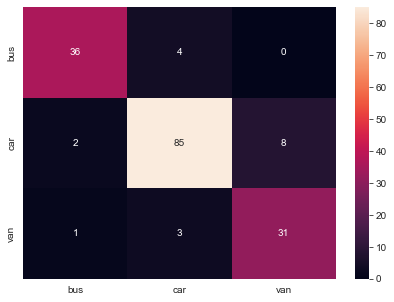

In [158]:
# Classification Accuracy
print('Accuracy on Training data:',svm_model.score(Xpca5_train, y_train))
print('Accuracy on Test data:',svm_model.score(Xpca5_test, y_test))

# Classification Report
print("Classification Report:\n",classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix Chart:")
cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2])
df_cm = pd.DataFrame(cm, index = [i for i in ["bus","car","van"]],
                  columns = [i for i in ["bus","car","van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')
plt.show()

**Evaluation metrics allow us to estimate errors to determine how well our models
are performing:**

> Accuracy: ratio of correct predictions over total predictions.

> Precision: how often the classifier is correct when it predicts positive.

> Recall: how often the classifier is correct for all positive instances.

> F-Score: single measurement to combine precision and recall.

In [159]:
# Model comparison and K Fold Cross Validation test
model = svm_model
y_pred = model.predict(Xpca5_test)
y1_pred = model.predict(Xpca5_train)
accuracies = cross_val_score(estimator= model, X = Xpca5_train, y = y_train, cv=10)

precision = precision_score(y_test,y_pred, average='macro')
recall = recall_score(y_test,y_pred, average='macro')
f1 = f1_score(y_test,y_pred, average='macro')

Train_Accuracy = accuracy_score(y_train,y1_pred)*100
Test_Accuracy = accuracy_score(y_test,y_pred)*100
K_Fold_Mean_Accuracy = accuracies.mean()*100
Std_Deviation = accuracies.std()*100

# base_1 = []
base_1.append(['SVM 5 PCs with Base Model', Train_Accuracy, Test_Accuracy, K_Fold_Mean_Accuracy, Std_Deviation, precision,
               recall, f1])
model_comparison = pd.DataFrame(base_1,columns=['Model','Train Accuracy','Test Accuracy','K-Fold Mean Accuracy',
                                                'Std. Deviation', 'Precision','Recall','F1 Score'])
model_comparison.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)
model_comparison

,Model,Train Accuracy,Test Accuracy,K-Fold Mean Accuracy,Std. Deviation,Precision,Recall,F1 Score
0,SVM All Variables Base Model,97.633136,96.470588,96.294996,2.027049,0.962093,0.962093,0.962093
1,SVM 5 PCs with Base Model,91.272189,89.411765,88.900351,3.408898,0.880621,0.893484,0.886107


**Insights:**
- Both the models are giving good accuracy in addition to other metrics, but just by using 5 principal components (instead of 18 in the base model), we are able to capture a great amount of variation in the data.
- The difference in performance metrics with PCA is even more noticeable as the number of dimensions increase.
- The accuracy, precision, recall and F1 Score values are reduced after applying PCA because we have reduced the number of dimensions.
- Despite giving less accuracy, precision and recall, this model is better as it has taken into consideration the relationship between the independent variables and reduced the columns which are highly correlated.

## 4. Performance Improvement:

### 4A. Train another SVM on the components out of PCA. Tune the parameters to improve performance.

In [160]:
# Using PCA with 6 components
pca6 = PCA(n_components=6)
pca6.fit(X)
print(pca6.components_)
print(pca6.explained_variance_ratio_)
Xpca6 = pca6.transform(X)

[[ 0.27242621  0.2874119   0.30232468  0.26954275  0.09774549  0.19503114
   0.31050809 -0.30894161  0.30731723  0.27813695  0.29977554  0.30604902
   0.26328707 -0.04149436  0.03596318  0.05865312  0.03774025  0.08448782]
 [-0.08734011  0.1319823  -0.0465069  -0.19852083 -0.25803986 -0.10827759
   0.07492999 -0.01285973  0.08741731  0.1217793   0.07669869  0.07246658
   0.21019169  0.50327713 -0.01561269 -0.0929281  -0.50162947 -0.50764602]
 [-0.03738182 -0.20110663  0.06413458  0.05470048 -0.06572916 -0.14732636
   0.10906013 -0.09052068  0.10609682 -0.21334439  0.1438746   0.11035328
  -0.20326854  0.07336692 -0.55741334  0.67253664 -0.06228027 -0.0411697 ]
 [ 0.1387816  -0.03682193  0.10859388 -0.25454776 -0.61247168  0.27963908
   0.00478337  0.06576229  0.0302556   0.04255843 -0.06464092 -0.00258968
  -0.08452759 -0.11555214  0.47654184  0.42496924 -0.02669905  0.09652292]
 [ 0.13713056 -0.13819989 -0.08017083  0.13328031  0.1229622  -0.63555893
   0.08570926 -0.07908724  0.08072

In [161]:
# Print the original features and the reduced features
print('Original number of features:', X.shape[1])
print('Reduced number of features:', Xpca6.shape[1])

Original number of features: 18
Reduced number of features: 6


In [162]:
# View the first 5 observations of the pca components
Xpca6_df = pd.DataFrame(data = Xpca6)
Xpca6_df.head()

,0,1,2,3,4,5
0,0.582503,-0.675955,-0.457698,-0.748545,-0.779823,-1.847461
1,-1.513738,-0.347311,-0.326278,1.270415,-0.325654,-0.118239
2,3.912479,0.232406,-1.265696,0.143719,0.912849,-0.686941
3,-1.538353,-3.042279,-0.467336,0.327081,-0.611684,0.369761
4,-0.639347,1.447634,-0.256540,-0.541234,0.457928,-1.004803


In [163]:
X_train_row, X_train_col = X_train.shape
print('The X_train comprises of', X_train_row, 'rows and', X_train_col, 'columns.')

The X_train comprises of 676 rows and 18 columns.


In [164]:
X_test_row, X_test_col = X_test.shape
print('The X_test comprises of', X_test_row, 'rows and', X_test_col, 'columns.')

The X_test comprises of 170 rows and 18 columns.


In [165]:
# Split the pca data into train and test ratio of 80:20
Xpca6_train, Xpca6_test, y_train, y_test = train_test_split(Xpca6, y, test_size=0.20, random_state=0)

In [166]:
Xpca6_train_row, Xpca6_train_col = Xpca6_train.shape
print('The Xpca6_train comprises of', Xpca6_train_row, 'rows and', Xpca6_train_col, 'columns.')

The Xpca6_train comprises of 676 rows and 6 columns.


In [167]:
 Xpca6_test_row,  Xpca6_test_col =  Xpca6_test.shape
print('The  Xpca6_test comprises of',  Xpca6_test_row, 'rows and',  Xpca6_test_col, 'columns.')

The  Xpca6_test comprises of 170 rows and 6 columns.


#### Use SVM without Oversampling

In [168]:
# Create svm_model Object
svm_model = SVC()

# Training the model
svm_model.fit(Xpca6_train, y_train)

# Predict testing set
y_pred = svm_model.predict(Xpca6_test)

Accuracy on Training data: 0.9230769230769231
Accuracy on Test data: 0.9058823529411765
Classification Report:
               precision    recall  f1-score   support

           0       0.92      0.88      0.90        40
           1       0.95      0.92      0.93        95
           2       0.80      0.91      0.85        35

    accuracy                           0.91       170
   macro avg       0.89      0.90      0.89       170
weighted avg       0.91      0.91      0.91       170

Confusion Matrix Chart:


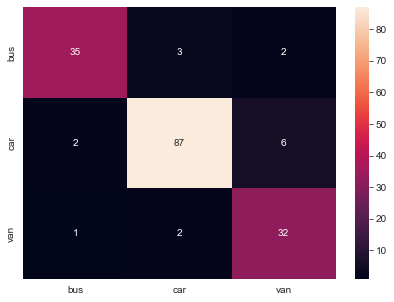

In [169]:
# Classification Accuracy
print('Accuracy on Training data:',svm_model.score(Xpca6_train, y_train))
print('Accuracy on Test data:',svm_model.score(Xpca6_test, y_test))

# Classification Report
print("Classification Report:\n",classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix Chart:")
cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2])
df_cm = pd.DataFrame(cm, index = [i for i in ["bus","car","van"]],
                  columns = [i for i in ["bus","car","van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')
plt.show()

In [170]:
# Model comparison and K Fold Cross Validation test
model = svm_model
y_pred = model.predict(Xpca6_test)
y1_pred = model.predict(Xpca6_train)
accuracies = cross_val_score(estimator= model, X = Xpca6_train, y = y_train, cv=10)

precision = precision_score(y_test,y_pred, average='macro')
recall = recall_score(y_test,y_pred, average='macro')
f1 = f1_score(y_test,y_pred, average='macro')

Train_Accuracy = accuracy_score(y_train,y1_pred)*100
Test_Accuracy = accuracy_score(y_test,y_pred)*100
K_Fold_Mean_Accuracy = accuracies.mean()*100
Std_Deviation = accuracies.std()*100

# base_1 = []
base_1.append(['SVM 6 PCs w/o Oversampling', Train_Accuracy, Test_Accuracy, K_Fold_Mean_Accuracy, Std_Deviation, precision,
               recall, f1])
model_comparison = pd.DataFrame(base_1,columns=['Model','Train Accuracy','Test Accuracy','K-Fold Mean Accuracy',
                                                'Std. Deviation', 'Precision','Recall','F1 Score'])
model_comparison.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)

#### Use SVM with Oversampling

Accuracy on Training data: 0.9260355029585798
Accuracy on Test data: 0.9235294117647059
Classification Report:
               precision    recall  f1-score   support

           0       0.93      0.95      0.94        40
           1       0.98      0.89      0.93        95
           2       0.81      0.97      0.88        35

    accuracy                           0.92       170
   macro avg       0.90      0.94      0.92       170
weighted avg       0.93      0.92      0.92       170

Confusion Matrix Chart:


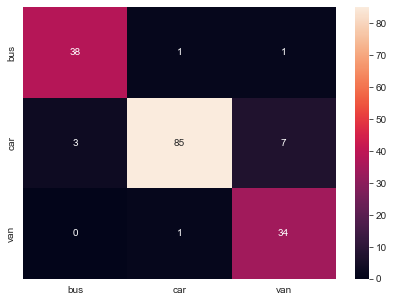

In [171]:
# Using SMOTE
smote=SMOTE(random_state=0)
X1, y1=smote.fit_resample(Xpca6_train, y_train)

#Training the model
svm_model.fit(X1, y1)

#Predict testing set
y_pred = svm_model.predict(Xpca6_test)

# Classification Accuracy
print('Accuracy on Training data:',svm_model.score(Xpca6_train, y_train))
print('Accuracy on Test data:',svm_model.score(Xpca6_test, y_test))

# Classification Report
print("Classification Report:\n",classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix Chart:")
cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2])
df_cm = pd.DataFrame(cm, index = [i for i in ["bus","car","van"]],
                  columns = [i for i in ["bus","car","van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')
plt.show()

In [172]:
# Target vector is balanced after oversampling
print('After oversampling distribution of target vector:')
print(y1.value_counts())

After oversampling distribution of target vector:
2    334
1    334
0    334
Name: class, dtype: int64


In [173]:
# Model comparison and K Fold Cross Validation test
model = svm_model
y_pred = model.predict(Xpca6_test)
y1_pred = model.predict(X1)
accuracies = cross_val_score(estimator= model, X = X1, y = y1, cv=10)

precision = precision_score(y_test,y_pred, average='macro')
recall = recall_score(y_test,y_pred, average='macro')
f1 = f1_score(y_test,y_pred, average='macro')

Train_Accuracy = accuracy_score(y1,y1_pred)*100
Test_Accuracy = accuracy_score(y_test,y_pred)*100
K_Fold_Mean_Accuracy = accuracies.mean()*100
Std_Deviation = accuracies.std()*100

# base_1 = []
base_1.append(['SVM 6 PCs with Oversampling', Train_Accuracy, Test_Accuracy, K_Fold_Mean_Accuracy, Std_Deviation, precision,
               recall, f1])
model_comparison = pd.DataFrame(base_1,columns=['Model','Train Accuracy','Test Accuracy','K-Fold Mean Accuracy',
                                                'Std. Deviation', 'Precision','Recall','F1 Score'])
model_comparison.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)

#### Use automated search without Oversampling for hyper-parameters.

In [174]:
#Create svm_model Object
svm_model = SVC()

svm_model.fit(Xpca6_train, y_train)

SVC()

In [175]:
# Exhaustive search over specified parameter values for an estimator.
# Important members are fit, predict.

# GridSearchCV implements a "fit" and a "score" method.
# It also implements "score_samples", "predict", "predict_proba",
# "decision_function", "transform" and "inverse_transform" if they are
# implemented in the estimator used.

# The parameters of the estimator used to apply these methods are optimized
# by cross-validated grid-search over a parameter grid.

grid_params = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}

gs = RandomizedSearchCV(svm_model, grid_params, cv=10, random_state=0)
gs.fit(Xpca6_train, y_train)

RandomizedSearchCV(cv=10, estimator=SVC(),
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   random_state=0)

In [176]:
pd.DataFrame({'param': gs.cv_results_["params"], 
              'score mean': gs.cv_results_["mean_test_score"], 
              'score s.d.': gs.cv_results_["std_test_score"],
             'rank': gs.cv_results_["rank_test_score"]})

,param,score mean,score s.d.,rank
0,"{'kernel': 'rbf', 'gamma': 0.1, 'C': 1}",0.908187,0.025758,1
1,"{'kernel': 'rbf', 'gamma': 0.1, 'C': 1000}",0.886018,0.034576,2
2,"{'kernel': 'rbf', 'gamma': 1, 'C': 0.1}",0.508955,0.014426,9
3,"{'kernel': 'sigmoid', 'gamma': 0.001, 'C': 10}",0.807748,0.038101,7
4,"{'kernel': 'sigmoid', 'gamma': 0.001, 'C': 100}",0.810733,0.054094,5
5,"{'kernel': 'poly', 'gamma': 0.001, 'C': 1000}",0.516374,0.025247,8
6,"{'kernel': 'linear', 'gamma': 0.0001, 'C': 0.1}",0.810733,0.054094,5
7,"{'kernel': 'poly', 'gamma': 0.001, 'C': 100}",0.494118,0.008613,10
8,"{'kernel': 'rbf', 'gamma': 0.001, 'C': 10}",0.819601,0.043320,3
9,"{'kernel': 'sigmoid', 'gamma': 0.001, 'C': 1000}",0.812270,0.050227,4


In [177]:
print('Best Parameters:', gs.best_params_, 'mean score: ', gs.best_score_, sep='\n')

Best Parameters:
{'kernel': 'rbf', 'gamma': 0.1, 'C': 1}
mean score: 
0.9081870061457419


In [178]:
# Lets Build SVM with best params

svm_model = SVC(C=1, gamma=0.1, kernel= 'rbf')

svm_model.fit(Xpca6_train, y_train)
y_pred = svm_model.predict(Xpca6_test)

Accuracy on Training data: 0.9363905325443787
Accuracy on Test data: 0.9235294117647059
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.93      0.94        40
           1       0.96      0.92      0.94        95
           2       0.82      0.94      0.88        35

    accuracy                           0.92       170
   macro avg       0.91      0.93      0.92       170
weighted avg       0.93      0.92      0.92       170

Confusion Matrix Chart:


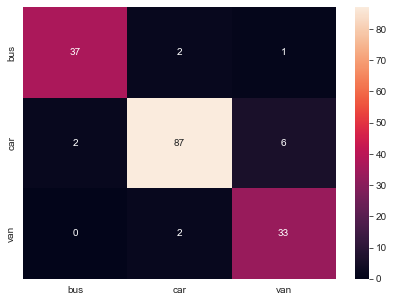

In [179]:
# Classification Accuracy
print('Accuracy on Training data:',svm_model.score(Xpca6_train, y_train))
print('Accuracy on Test data:',svm_model.score(Xpca6_test, y_test))

# Classification Report
print("Classification Report:\n",classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix Chart:")
cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2])
df_cm = pd.DataFrame(cm, index = [i for i in ["bus","car","van"]],
                  columns = [i for i in ["bus","car","van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')
plt.show()

In [180]:
# Model comparison and K Fold Cross Validation test
model = svm_model
y_pred = model.predict(Xpca6_test)
y1_pred = model.predict(Xpca6_train)
accuracies = cross_val_score(estimator= model, X = Xpca6_train, y = y_train, cv=10)

precision = precision_score(y_test,y_pred, average='macro')
recall = recall_score(y_test,y_pred, average='macro')
f1 = f1_score(y_test,y_pred, average='macro')

Train_Accuracy = accuracy_score(y_train,y1_pred)*100
Test_Accuracy = accuracy_score(y_test,y_pred)*100
K_Fold_Mean_Accuracy = accuracies.mean()*100
Std_Deviation = accuracies.std()*100

# base_1 = []
base_1.append(['SVM 6 PCs with Hyperparameters', Train_Accuracy, Test_Accuracy, K_Fold_Mean_Accuracy, Std_Deviation, precision,
               recall, f1])
model_comparison = pd.DataFrame(base_1,columns=['Model','Train Accuracy','Test Accuracy','K-Fold Mean Accuracy',
                                                'Std. Deviation', 'Precision','Recall','F1 Score'])
model_comparison.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)

#### Use automated search with Oversampling for hyper-parameters.

In [181]:
#Create svm_model Object
svm_model = SVC()

# Using SMOTE
# smote=SMOTE(random_state=0)
# X1, y1=smote.fit_resample(Xpca6_train, y_train)

#Training the model
svm_model.fit(X1, y1)

SVC()

In [182]:
# Exhaustive search over specified parameter values for an estimator.
# Important members are fit, predict.

# GridSearchCV implements a "fit" and a "score" method.
# It also implements "score_samples", "predict", "predict_proba",
# "decision_function", "transform" and "inverse_transform" if they are
# implemented in the estimator used.

# The parameters of the estimator used to apply these methods are optimized
# by cross-validated grid-search over a parameter grid.

grid_params = {'C': [0.1, 1, 10, 100, 1000],
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}

gs = RandomizedSearchCV(svm_model, grid_params, cv=10, random_state=0)
gs.fit(Xpca6_train, y_train)

RandomizedSearchCV(cv=10, estimator=SVC(),
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['linear', 'poly', 'rbf',
                                                   'sigmoid']},
                   random_state=0)

In [183]:
pd.DataFrame({'param': gs.cv_results_["params"], 
              'score mean': gs.cv_results_["mean_test_score"], 
              'score s.d.': gs.cv_results_["std_test_score"],
             'rank': gs.cv_results_["rank_test_score"]})

,param,score mean,score s.d.,rank
0,"{'kernel': 'rbf', 'gamma': 0.1, 'C': 1}",0.908187,0.025758,1
1,"{'kernel': 'rbf', 'gamma': 0.1, 'C': 1000}",0.886018,0.034576,2
2,"{'kernel': 'rbf', 'gamma': 1, 'C': 0.1}",0.508955,0.014426,9
3,"{'kernel': 'sigmoid', 'gamma': 0.001, 'C': 10}",0.807748,0.038101,7
4,"{'kernel': 'sigmoid', 'gamma': 0.001, 'C': 100}",0.810733,0.054094,5
5,"{'kernel': 'poly', 'gamma': 0.001, 'C': 1000}",0.516374,0.025247,8
6,"{'kernel': 'linear', 'gamma': 0.0001, 'C': 0.1}",0.810733,0.054094,5
7,"{'kernel': 'poly', 'gamma': 0.001, 'C': 100}",0.494118,0.008613,10
8,"{'kernel': 'rbf', 'gamma': 0.001, 'C': 10}",0.819601,0.043320,3
9,"{'kernel': 'sigmoid', 'gamma': 0.001, 'C': 1000}",0.812270,0.050227,4


In [184]:
print('Best Parameters:', gs.best_params_, 'mean score: ', gs.best_score_, sep='\n')

Best Parameters:
{'kernel': 'rbf', 'gamma': 0.1, 'C': 1}
mean score: 
0.9081870061457419


In [185]:
# Lets Build SVM with best params

svm_model = SVC(C=1, gamma=0.1, kernel= 'rbf')

svm_model.fit(X1, y1)
y_pred = svm_model.predict(Xpca6_test)

Accuracy on Training data: 0.9349112426035503
Accuracy on Test data: 0.9294117647058824
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95        40
           1       0.98      0.91      0.94        95
           2       0.81      0.97      0.88        35

    accuracy                           0.93       170
   macro avg       0.91      0.94      0.92       170
weighted avg       0.94      0.93      0.93       170

Confusion Matrix Chart:


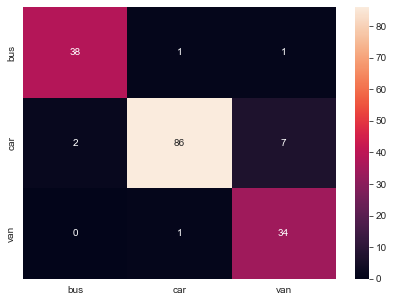

In [186]:
# Classification Accuracy
print('Accuracy on Training data:',svm_model.score(Xpca6_train, y_train))
print('Accuracy on Test data:',svm_model.score(Xpca6_test, y_test))

# Classification Report
print("Classification Report:\n",classification_report(y_test, y_pred))

# Confusion Matrix
print("Confusion Matrix Chart:")
cm = confusion_matrix(y_test, y_pred, labels=[0, 1, 2])
df_cm = pd.DataFrame(cm, index = [i for i in ["bus","car","van"]],
                  columns = [i for i in ["bus","car","van"]])
plt.figure(figsize = (7,5))
sns.heatmap(df_cm, annot=True, fmt='g')
plt.show()

### 4B. Share best Parameters observed from above step.

In [187]:
# Refer section 4A above for detailed analysis
# Refer section 4C below for model comparison
print('Best Parameters:', gs.best_params_, 'mean score: ', gs.best_score_, sep='\n')

Best Parameters:
{'kernel': 'rbf', 'gamma': 0.1, 'C': 1}
mean score: 
0.9081870061457419


### 4C. Print Classification metrics for train data of above model and share relative improvement in performance in all the models along with insights.

In [188]:
# Final Table: Model comparison and K Fold Cross Validation test
model = svm_model
y_pred = model.predict(Xpca6_test)
y1_pred = model.predict(X1)
accuracies = cross_val_score(estimator= model, X = X1, y = y1, cv=10)

precision = precision_score(y_test,y_pred, average='macro')
recall = recall_score(y_test,y_pred, average='macro')
f1 = f1_score(y_test,y_pred, average='macro')

Train_Accuracy = accuracy_score(y1,y1_pred)*100
Test_Accuracy = accuracy_score(y_test,y_pred)*100
K_Fold_Mean_Accuracy = accuracies.mean()*100
Std_Deviation = accuracies.std()*100

# base_1 = []
base_1.append(['SVM 6 PCs with Hyperparameters and Oversampling', Train_Accuracy, Test_Accuracy, K_Fold_Mean_Accuracy, Std_Deviation, precision,
               recall, f1])
model_comparison = pd.DataFrame(base_1,columns=['Model','Train Accuracy','Test Accuracy','K-Fold Mean Accuracy',
                                                'Std. Deviation', 'Precision','Recall','F1 Score'])
model_comparison.sort_values(by=['Recall','F1 Score'],inplace=True,ascending=False)
model_comparison

,Model,Train Accuracy,Test Accuracy,K-Fold Mean Accuracy,Std. Deviation,Precision,Recall,F1 Score
0,SVM All Variables Base Model,97.633136,96.470588,96.294996,2.027049,0.962093,0.962093,0.962093
5,SVM 6 PCs with Hyperparameters and Oversampling,95.209581,92.941176,93.509901,1.917330,0.912266,0.942231,0.924336
3,SVM 6 PCs with Oversampling,94.610778,92.352941,93.313861,1.948977,0.904455,0.938722,0.918485
4,SVM 6 PCs with Hyperparameters,93.639053,92.352941,90.818701,2.575835,0.909921,0.927882,0.917398
2,SVM 6 PCs w/o Oversampling,92.307692,90.588235,90.963565,3.100622,0.888902,0.901692,0.893750
1,SVM 5 PCs with Base Model,91.272189,89.411765,88.900351,3.408898,0.880621,0.893484,0.886107


**Insights:**
- As is evident from the above table, just by using 6 principal components instead of 18 in the base model, we are getting above 90% accuracy in addition to other improved performance metrics.
- Some changes are also visible as we use oversampling to handle the imbalanced dataset.
- Accuracy further improves with hyper-parameter tuning.
- We are getting the best performance metrics by using both the Oversampling and Hyper-parameter tuning approach.
- Majority of the variation in the dataset is captured with just the 6 components accompanied by a very good amount of dimensionality reduction.

## 5. Data Understanding & Cleaning:

### 5A. Explain pre-requisite/assumptions of PCA.

**There are some assumptions in PCA which are to be followed as they will lead to accurate functioning of this dimensionality reduction technique in ML. The assumptions in PCA are:**
- There needs to be a linear relationship between all variables. The reason for this assumption is that a PCA is based on Pearson correlation coefficients, so there needs to be a linear relationship between the variables.
- We should have sampling adequacy, which simply means that for PCA to produce a reliable result, large enough sample sizes are required. General rule of thumb: a minimum of 150 cases, or 5 to 10 cases per variable, has been recommended as a minimum sample size. There are a few methods to detect sampling adequacy: (1) the Kaiser-Meyer-Olkin (KMO) Measure of Sampling Adequacy for the overall data set; and (2) the KMO measure for each individual variable.
- The data should be suitable for data reduction. We need to have adequate correlations between the variables in order for variables to be reduced to a smaller number of components.
- We should not have significant outliers. Outliers are important because these can have a disproportionate influence on our results. 
- We should have Interval-level measurement. All variables should be assessed on an interval or ratio level of measurement.
- Technical implementations often assume no missing values.

### 5B. Explain advantages and limitations of PCA.

**PCA offers multiple benefits, but it also suffers from certain shortcomings:**

Advantages of PCA:

- Easy to compute: PCA is based on linear algebra, which is computationally easy to solve by computers.
- Speeds up other machine learning algorithms: Machine learning algorithms converge faster when trained on principal components instead of the original dataset.
- Counteracts the issues of high-dimensional data: High-dimensional data causes regression-based algorithms to overfit easily. By using PCA beforehand to lower the dimensions of the training dataset, we prevent the predictive algorithms from overfitting.
- PCA improves the data visualization for easy understanding.

Disadvantages of PCA:

- Data normalization must be done before applying PCA.
- Low interpretability of principal components: Principal components are linear combinations of the features from the original data, but they are not as easy to interpret. For example, it is difficult to tell which are the most important features in the dataset after computing principal components. 
- The trade-off between information loss and dimensionality reduction: Although dimensionality reduction is useful, it comes at a cost. Information loss is a necessary part of PCA. Balancing the trade-off between dimensionality reduction and information loss is unfortunately a necessary compromise that we have to make when using PCA.

# References:

1. [Towards Data Science](https://towardsdatascience.com)
2. [Kaggle. Kaggle Code](https://www.kaggle.com/code)
3. [KdNuggets](https://www.kdnuggets.com/)
4. [AnalyticsVidhya](https://www.analyticsvidhya.com/blog/)
5. [Wikipedia](https://en.wikipedia.org/)
6. [Numpy](https://numpy.org/)
7. [Pandas](https://pandas.pydata.org/)
8. [SciPy](https://scipy.org/)
9. [MatplotLib](https://matplotlib.org/)
10. [Seaborn](https://seaborn.pydata.org/)
11. [Python](https://www.python.org/)
12. [Plotly](https://plotly.com/)
13. [Bokeh](https://docs.bokeh.org/en/latest/)
14. [RStudio](https://www.rstudio.com/)
15. [MiniTab](https://www.minitab.com/en-us/)
16. [Anaconda](https://www.anaconda.com/)